<img src="https://www.metu.edu.tr/system/files/logo_orj/5/5.4.jpg" width="400" alt="Weights & Biases" />

# <font color='RED'>**Predictive Analysis of Residential Property Pricing Using Machine Learning Models**</font> 

Prepared by **Engin Deniz Erkan**


## Necessary Libraries

In [ ]:
pip install shap

In [ ]:
pip install catboost

In [ ]:
pip install wandb

In [72]:
import pandas as pd
import numpy as np
import seaborn as sns
import scipy.stats as stats
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import scipy.stats as stats
from IPython.display import display, HTML
from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import matplotlib.pyplot as plt
from tabulate import tabulate
from sklearn.preprocessing import LabelEncoder

## Read Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [74]:
data = pd.read_csv('/content/drive/MyDrive/IS580/TermProject/train.csv')

In [75]:
# ID column is not necessary for model training
if 'Id' in data.columns:
    data = data.drop('Id', axis=1)  # Drop the 'Id' column if it exists

# Split data into training and validation (%90) and test sets (%10)
df_train, df_test = train_test_split(data, test_size=0.1, random_state=2299790)

print("Training data shape:", df_train.shape)
print("Test data shape:", df_test.shape)

Training data shape: (1314, 80)
Test data shape: (146, 80)


In [ ]:
def create_scrollable_table(df, table_id, title):
    html = f'<h3>{title}</h3>'
    html += f'<div id="{table_id}" style="height:200px; overflow:auto;">'
    html += df.to_html(classes='table table-bordered table-striped table-hover')
    html += '</div>'
    return html

data_table = create_scrollable_table(df_train, "Data", "Data Overview")
display(HTML(data_table))

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
431,50,RM,60.0,5586,Pave,NaN,IR1,Bnk,AllPub,Inside,Gtl,OldTown,Feedr,Norm,1Fam,1.5Fin,6,7,1920,1998,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,901,901,GasA,Gd,Y,SBrkr,1088,110,0,1198,0,0,1,0,4,1,TA,7,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,98,0,0,0,0,NaN,MnPrv,NaN,0,9,2008,ConLD,Abnorml,79900
575,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,GasA,TA,Y,SBrkr,832,384,0,1216,0,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1947.0,Unf,1,336,TA,TA,Y,158,0,102,0,0,0,NaN,NaN,NaN,0,10,2008,COD,Abnorml,118500
495,30,C (all),60.0,7879,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,4,5,1920,1950,Gable,CompShg,Wd Sdng,Wd Sdng,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,495,Unf,0,225,720,GasA,TA,N,FuseA,720,0,0,720,0,0,1,0,2,1,TA,4,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,523,115,0,0,0,NaN,GdWo,NaN,0,11,2009,WD,Abnorml,34900
697,20,RL,57.0,6420,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,7,1952,1952,Gable,CompShg,Wd Sdng,Wd Sdng,NaN,0.0,TA,TA,PConc,Ex,Gd,Mn,LwQ,210,ALQ,551,219,980,GasA,Fa,Y,FuseA,1148,0,0,1148,0,1,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1952.0,Unf,1,308,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,9,2006,WD,Normal,123500
1231,90,RL,70.0,7728,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,Duplex,SLvl,5,6,1962,1962,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,120.0,TA,TA,CBlock,TA,TA,Av,ALQ,803,Unf,0,303,1106,GasA,TA,Y,SBrkr,1190,0,0,1190,1,0,1,0,3,1,TA,6,Typ,0,NaN,Attchd,1962.0,Unf,2,540,TA,TA,Y,0,18,0,0,0,0,NaN,GdWo,NaN,0,5,2006,WD,Normal,132500
739,60,RL,65.0,9313,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2004,2004,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,864,864,GasA,Ex,Y,SBrkr,864,864,0,1728,0,0,2,1,3,1,Gd,7,Typ,0,NaN,Attchd,2004.0,RFn,2,572,TA,TA,Y,187,56,0,0,0,0,NaN,NaN,NaN,0,4,2009,WD,Normal,190000
462,20,RL,60.0,8281,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,5,1965,1965,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,553,BLQ,311,0,864,GasA,Gd,Y,SBrkr,864,0,0,864,0,0,1,0,3,1,TA,5,Typ,1,Po,Detchd,1965.0,Unf,1,360,TA,TA,Y,0,0,236,0,0,0,NaN,GdWo,NaN,0,12,2009,WD,Normal,62383
1008,20,RL,43.0,12118,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Mitchel,Norm,Norm,1Fam,1Story,7,5,2004,2005,Hip,CompShg,VinylSd,VinylSd,Stone,108.0,Gd,TA,PConc,Ex,TA,Mn,Unf,0,Unf,0,1710,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,0,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,Fin,2,550,TA,TA,Y,100,48,0,0,180,0,NaN,NaN,NaN,0,4,2009,WD,Normal,240000
680,120,RL,50.0,8012,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,TwnhsE,1Story,6,5,1980,1980,Gable,CompShg,Plywood,Plywood,NaN,0.0,TA,TA,CBlock,Gd,TA,No,BLQ,543,BLQ,119,261,923,GasA,TA,Y,SBrkr,923,0,0,923,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1980.0,RFn,1,264,TA,TA,Y,80,0,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal,143000
276,20,RL,129.0,9196,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,Gd,TA,PConc,Ex,TA,No,Unf,0,Unf,0,1560,1560,GasA,Ex,Y,SBrkr,1560,0,0,1560,0,0,2,0,3,1,Gd,7,Typ,0,NaN,At

In [ ]:
# Determine the number of numerical and categorical columns
num_numerical = df_train.select_dtypes(include=['number']).shape[1]
num_categorical = df_train.select_dtypes(include=['object', 'category']).shape[1]

print(f'Number of numerical columns: {num_numerical}')
print(f'Number of categorical columns: {num_categorical}')

Number of numerical columns: 37
Number of categorical columns: 43


There are totally:
- 36 numerical columns
- 43 categorical columns
- 1 target variable - SalePrice (numerical)

## Exploratory Data Analysis (EDA)


### Information about the data

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1314 entries, 431 to 1419
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1314 non-null   int64  
 1   MSZoning       1314 non-null   object 
 2   LotFrontage    1083 non-null   float64
 3   LotArea        1314 non-null   int64  
 4   Street         1314 non-null   object 
 5   Alley          82 non-null     object 
 6   LotShape       1314 non-null   object 
 7   LandContour    1314 non-null   object 
 8   Utilities      1314 non-null   object 
 9   LotConfig      1314 non-null   object 
 10  LandSlope      1314 non-null   object 
 11  Neighborhood   1314 non-null   object 
 12  Condition1     1314 non-null   object 
 13  Condition2     1314 non-null   object 
 14  BldgType       1314 non-null   object 
 15  HouseStyle     1314 non-null   object 
 16  OverallQual    1314 non-null   int64  
 17  OverallCond    1314 non-null   int64  
 18  YearBuilt  

<font color='RED'>- There are totally 1314 rows of data for training</font>  


In [ ]:
# Filter to only numerical columns
numerical_df = df_train.select_dtypes(include=[np.number])

# Describe the numerical columns
numerical_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,1314.0,56.381279,41.844087,20.0,20.00,50.0,70.00,190.0
LotFrontage,1083.0,70.241921,24.566117,21.0,59.00,70.0,80.00,313.0
LotArea,1314.0,10572.856164,10298.948563,1300.0,7590.00,9522.5,11613.50,215245.0
OverallQual,1314.0,6.096651,1.392157,1.0,5.00,6.0,7.00,10.0
OverallCond,1314.0,5.580670,1.119633,1.0,5.00,5.0,6.00,9.0
YearBuilt,1314.0,1970.860731,30.109998,1872.0,1954.00,1972.0,2000.00,2010.0
YearRemodAdd,1314.0,1984.535769,20.730285,1950.0,1966.00,1993.0,2004.00,2010.0
MasVnrArea,1306.0,105.022971,183.576068,0.0,0.00,0.0,168.00,1600.0
BsmtFinSF1,1314.0,443.054033,460.619908,0.0,0.00,379.0,711.00,5644.0
BsmtFinSF2,1314.0,47.366058,162.289547,0.0,0.00,0.0,0.00,1474.0


The SalePrice ranges from 34900 to 755000 with a mean of approximately 180964 $.

In [ ]:
# Filter the DataFrame to include only categorical columns
categorical_df = df_train.select_dtypes(include=['object', 'category'])

# Display the descriptive statistics of the categorical columns
categorical_df.describe().T

,count,unique,top,freq
MSZoning,1314,5,RL,1036
Street,1314,2,Pave,1308
Alley,82,2,Grvl,46
LotShape,1314,4,Reg,834
LandContour,1314,4,Lvl,1180
Utilities,1314,2,AllPub,1313
LotConfig,1314,5,Inside,943
LandSlope,1314,3,Gtl,1244
Neighborhood,1314,25,NAmes,205
Condition1,1314,9,Norm,1130


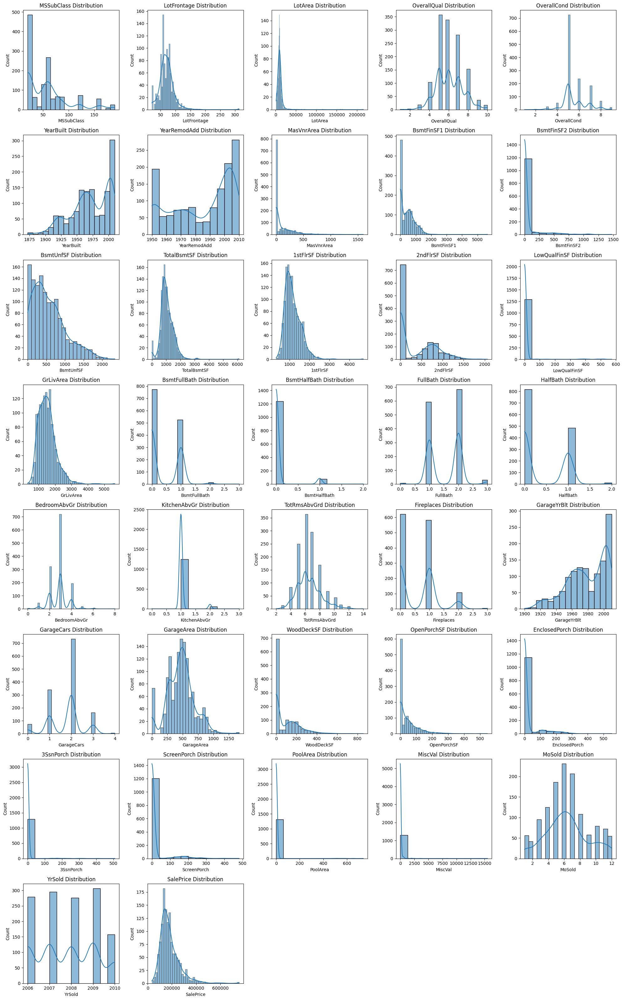

In [ ]:
num_plots = len(numerical_df.columns)
num_columns = 5
num_rows = num_plots // num_columns + (1 if num_plots % num_columns > 0 else 0)

plt.figure(figsize=(20, 4 * num_rows))

for i, column in enumerate(numerical_df.columns):
    plt.subplot(num_rows, num_columns, i + 1)
    sns.histplot(numerical_df[column], kde=True)
    plt.title(f'{column} Distribution')

plt.tight_layout()
plt.show()

### Dealing with Missing Values

In [78]:
missing_data = df_train.isnull().sum()
missing_percentage = (missing_data / len(df_train)) * 100
missing_columns = missing_data[missing_data > 0]
missing_columns_sorted = missing_columns.sort_values(ascending=False)

table = pd.DataFrame({
    'Missing Data Count': missing_columns_sorted,
    'Missing Data Percentage (%)': (missing_columns_sorted / len(df_train)) * 100
})

table.index.name = 'Columns'
print(tabulate(table, headers='keys', tablefmt='fancy_grid'))

╒══════════════╤══════════════════════╤═══════════════════════════════╕
│ Columns      │   Missing Data Count │   Missing Data Percentage (%) │
╞══════════════╪══════════════════════╪═══════════════════════════════╡
│ PoolQC       │                 1307 │                    99.4673    │
├──────────────┼──────────────────────┼───────────────────────────────┤
│ MiscFeature  │                 1265 │                    96.2709    │
├──────────────┼──────────────────────┼───────────────────────────────┤
│ Alley        │                 1232 │                    93.7595    │
├──────────────┼──────────────────────┼───────────────────────────────┤
│ Fence        │                 1054 │                    80.2131    │
├──────────────┼──────────────────────┼───────────────────────────────┤
│ MasVnrType   │                  787 │                    59.8935    │
├──────────────┼──────────────────────┼───────────────────────────────┤
│ FireplaceQu  │                  621 │                    47.26

In [ ]:
def color_label(unique_values):
    if 'nan' in unique_values:
        return unique_values.replace('nan', '\033[91mnan\033[0m')
    else:
        return unique_values

# Check for missing values in each column
missing_values = df_train.isnull().sum()

# Filter columns with missing values
columns_with_missing = missing_values[missing_values > 0]

# Calculate number of non-null values for each column
non_null_count = df_train[columns_with_missing.index].notnull().sum()

# Calculate number of unique labels for each column
unique_labels_count = df_train[columns_with_missing.index].nunique()

# Retrieve unique labels for each column
unique_labels = df_train[columns_with_missing.index].apply(lambda col: color_label(str(col.unique())), axis=0)

# Combine missing values, unique labels count, unique labels, and non-null count into a DataFrame
missing_info = pd.DataFrame({'Attribute Name': columns_with_missing.index,
                             'Non-Null Count': non_null_count.values,
                             'Missing Value Count': columns_with_missing.values,
                             'Unique Labels Count': unique_labels_count.values,
                             'Unique Labels': unique_labels})

# Sort the DataFrame by 'Missing Value Count' in descending order
missing_info_sorted = missing_info.sort_values(by='Missing Value Count', ascending=False)

if len(missing_info_sorted) > 0:
    print(tabulate(missing_info_sorted, headers="keys", tablefmt="grid", showindex=False))
else:
    print("No missing values found in any column.")

+------------------+------------------+-----------------------+-----------------------+--------------------------------------------------------------------------+
| Attribute Name   |   Non-Null Count |   Missing Value Count |   Unique Labels Count | Unique Labels                                                            |
+==================+==================+=======================+=======================+==========================================================================+
| PoolQC           |                7 |                  1307 |                     3 | [nan 'Fa' 'Gd' 'Ex']                                                     |
+------------------+------------------+-----------------------+-----------------------+--------------------------------------------------------------------------+
| MiscFeature      |               49 |                  1265 |                     4 | [nan 'Shed' 'Gar2' 'TenC' 'Othr']                                        |
+------------------+--

***Descriptions of columns with a missing value***

---

PoolQC: Pool quality

       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       NA	No Pool

MiscFeature: Miscellaneous feature not covered in other categories

       Elev	Elevator
       Gar2	2nd Garage (if not described in garage section)
       Othr	Other
       Shed	Shed (over 100 SF)
       TenC	Tennis Court
       NA	None

Alley: Type of alley access to property

       Grvl	Gravel
       Pave	Paved
       NA 	No alley access

Fence: Fence quality

       GdPrv	Good Privacy
       MnPrv	Minimum Privacy
       GdWo	Good Wood
       MnWw	Minimum Wood/Wire
       NA	No Fence

MasVnrType: Masonry veneer type

       BrkCmn	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       None	None
       Stone	Stone

FireplaceQu: Fireplace quality

       Ex	Excellent - Exceptional Masonry Fireplace
       Gd	Good - Masonry Fireplace in main level
       TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
       Fa	Fair - Prefabricated Fireplace in basement
       Po	Poor - Ben Franklin Stove
       NA	No Fireplace

LotFrontage:

      Linear feet of street connected to property

GarageType: Garage location

       2Types	More than one type of garage
       Attchd	Attached to home
       Basment	Basement Garage
       BuiltIn	Built-In (Garage part of house - typically has room above garage)
       CarPort	Car Port
       Detchd	Detached from home
       NA	No Garage

GarageYrBlt:

      Year garage was built

GarageFinish: Interior finish of the garage

       Fin	Finished
       RFn	Rough Finished
       Unf	Unfinished
       NA	No Garage

GarageQual: Garage quality

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage

BsmtFinType2: Rating of basement finished area (if multiple types)

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement

BsmtExposure: Refers to walkout or garden level walls

       Gd	Good Exposure
       Av	Average Exposure (split levels or foyers typically score average or above)
       Mn	Mimimum Exposure
       No	No Exposure
       NA	No Basement

BsmtFinType1: Rating of basement finished area

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement

BsmtCond: Evaluates the general condition of the basement

       Ex	Excellent
       Gd	Good
       TA	Typical - slight dampness allowed
       Fa	Fair - dampness or some cracking or settling
       Po	Poor - Severe cracking, settling, or wetness
       NA	No Basement

BsmtQual: Evaluates the height of the basement

       Ex	Excellent (100+ inches)
       Gd	Good (90-99 inches)
       TA	Typical (80-89 inches)
       Fa	Fair (70-79 inches)
       Po	Poor (<70 inches)
       NA	No Basement

MasVnrArea:

        Masonry veneer area in square feet

Electrical: Electrical system

       SBrkr	Standard Circuit Breakers & Romex
       FuseA	Fuse Box over 60 AMP and all Romex wiring (Average)
       FuseF	60 AMP Fuse Box and mostly Romex wiring (Fair)
       FuseP	60 AMP Fuse Box and mostly knob & tube wiring (poor)
       Mix	Mixed



In [ ]:
def fill_missing_values(data):
    # Replace "NA" with appropriate values for categorical columns
    categorical_fill_values = {
        'PoolQC': 'NoPool',
        'MiscFeature': 'None',
        'Alley': 'NoAlley',
        'Fence': 'NoFence',
        'FireplaceQu': 'NoFireplace',
        'GarageType': 'NoGarage',
        'GarageFinish': 'NoGarage',
        'GarageQual': 'NoGarage',
        'GarageCond': 'NoGarage',
        'BsmtFinType2': 'NoBasement',
        'BsmtExposure': 'NoBasement',
        'BsmtFinType1': 'NoBasement',
        'BsmtCond': 'NoBasement',
        'BsmtQual': 'NoBasement',
        'MasVnrType': 'None'
    }

    for column, value in categorical_fill_values.items():
        data[column].fillna(value, inplace=True)

    data['Electrical'].fillna(data['Electrical'].mode()[0], inplace=True)

    # Replace "NA" with zero or median for numerical columns
    numerical_fill_values = {
        'MasVnrArea': 0,
        'GarageYrBlt': data['GarageYrBlt'].median(),
        'LotFrontage': data['LotFrontage'].median()
    }

    for column, value in numerical_fill_values.items():
        data[column].fillna(value, inplace=True)

    return data

def check_missing_values(df):
    missing_values = df.isnull().sum()
    missing_values = missing_values[missing_values > 0]
    return missing_values

df = fill_missing_values(df_train)
df_test = fill_missing_values(df_test)

missing_values_df = check_missing_values(df_train)
missing_values_df_test = check_missing_values(df_test)

if missing_values_df.empty:
    print("No missing values in the training set.")
else:
    print("Missing values in the training set:")
    print(missing_values_df)

if missing_values_df_test.empty:
    print("No missing values in the test set.")
else:
    print("Missing values in the test set:")
    print(missing_values_df_test)

No missing values in the training set.
No missing values in the test set.


### More information about the target variable

Summary statistics for the 'SalePrice ($)' column:
count      1314.000000
mean     180964.779300
std       79965.298636
min       34900.000000
25%      129925.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64


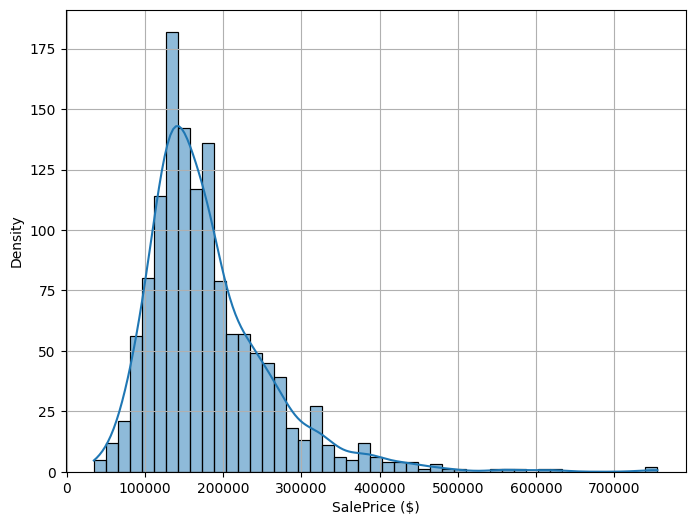

In [ ]:
# Display summary statistics for the 'SalePrice' column
print("Summary statistics for the 'SalePrice ($)' column:")
print(df_train['SalePrice'].describe())

plt.figure(figsize=(8, 6))

sns.histplot(df['SalePrice'], alpha=0.5, kde=True)
plt.xlabel('SalePrice ($)')
plt.ylabel('Density')
plt.grid(True)
plt.show()

In [ ]:
#skewness and kurtosis
print("Skewness: %f" % df_train['SalePrice'].skew())
print("Kurtosis: %f" % df_train['SalePrice'].kurt())

Skewness: 1.909186
Kurtosis: 6.777461


In [ ]:
# Function to classify columns according to data type
def get_column_info(dataframe):
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    return num_cols, cat_cols

# Function to plot average SalePrice for categorical columns
def cat_target_summary_plots(dataframe, cat_cols, target_col):
    num_plots = len(cat_cols)
    cols_in_row = 4
    rows = (num_plots + cols_in_row - 1) // cols_in_row

    fig = make_subplots(rows=rows, cols=cols_in_row, subplot_titles=[f"{cat_col}" for cat_col in cat_cols])

    colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

    for i, cat_col in enumerate(cat_cols, start=1):
        row_num = (i - 1) // cols_in_row + 1
        col_num = (i - 1) % cols_in_row + 1

        mean_values = dataframe.groupby(cat_col)[target_col].mean().reset_index()
        fig.add_trace(go.Bar(x=mean_values[cat_col], y=mean_values[target_col], name=cat_col, marker_color=colors[i % len(colors)]), row=row_num, col=col_num)
        fig.update_xaxes(row=row_num, col=col_num, tickangle=45, tickmode='array', tickvals=mean_values[cat_col], ticktext=mean_values[cat_col])
        fig.update_yaxes(title_text='Average SalePrice ($)', row=row_num, col=col_num)

    fig.update_layout(
        height=rows * 400,
        showlegend=False,
        plot_bgcolor='rgba(0, 0, 50, 0.9)',
        paper_bgcolor='rgba(0, 0, 50, 0.9)',
    )

    fig.show()

num_cols, cat_cols = get_column_info(df_train)
cat_target_summary_plots(df_train, cat_cols, "SalePrice")


## Handling Categorical Variables

In [ ]:
# Concatenate train and test datasets to ensure consistency in encoding
combined_df = pd.concat([df_train, df_test], axis=0)

label_encoder = LabelEncoder()

# Iterate through each column in the combined dataset
for col in combined_df.columns:
    # Check if the column is categorical
    if combined_df[col].dtype == 'object':
        # Fit label encoder on combined data
        label_encoder.fit(combined_df[col])

        # Transform both train and test data
        df_train[col] = label_encoder.transform(df_train[col])
        df_test[col] = label_encoder.transform(df_test[col])

## Data Preprocessing

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA

# Data Preprocessing Functions
def standardization(df):
    target = df['SalePrice'].reset_index(drop=True)
    features = df.drop(columns=['SalePrice']).reset_index(drop=True)
    scaler = StandardScaler()
    scaled_features = scaler.fit_transform(features)
    df_standard = pd.DataFrame(scaled_features, columns=features.columns)
    df_standard['SalePrice'] = target
    return df_standard

def min_max_scaling(df):
    target = df['SalePrice'].reset_index(drop=True)
    features = df.drop(columns=['SalePrice']).reset_index(drop=True)
    scaler = MinMaxScaler()
    scaled_features = scaler.fit_transform(features)
    df_minmax = pd.DataFrame(scaled_features, columns=features.columns)
    df_minmax['SalePrice'] = target
    return df_minmax

def log_transformation(df):
    target = df['SalePrice'].reset_index(drop=True)
    features = df.drop(columns=['SalePrice']).reset_index(drop=True)
    transformed_features = features.apply(lambda x: np.log1p(x))
    df_log = pd.DataFrame(transformed_features, columns=features.columns)
    df_log['SalePrice'] = target
    return df_log

# Feature Selection using RFE
def feature_selection_rfe(df, n_features_to_select=10):
    target = df['SalePrice']
    features = df.drop(columns=['SalePrice'])
    model = RandomForestRegressor(n_estimators=50)
    selector = RFE(model, n_features_to_select=n_features_to_select, step=1)
    selector = selector.fit(features, target)
    selected_features = features.columns[selector.support_]
    return df[selected_features].join(target), selected_features

# Feature Selection using PCA
def feature_selection_pca(df, n_components=10):
    target = df['SalePrice'].reset_index(drop=True)
    features = df.drop(columns=['SalePrice']).reset_index(drop=True)
    pca = PCA(n_components=n_components)
    principal_components = pca.fit_transform(features)
    columns = [f'PC{i+1}' for i in range(n_components)]
    df_pca = pd.DataFrame(principal_components, columns=columns)
    df_pca['SalePrice'] = target
    return df_pca

df_train_standard = standardization(df_train)
df_test_standard = standardization(df_test)

df_train_minmax = min_max_scaling(df_train)
df_test_minmax = min_max_scaling(df_test)

df_train_log = log_transformation(df_train)
df_test_log = log_transformation(df_test)

# Feature Selection on Training Data
df_train_standard_rfe, selected_features_standard_rfe = feature_selection_rfe(df_train_standard, n_features_to_select=10)
df_train_minmax_rfe, selected_features_minmax_rfe = feature_selection_rfe(df_train_minmax, n_features_to_select=10)
df_train_log_rfe, selected_features_log_rfe = feature_selection_rfe(df_train_log, n_features_to_select=10)

# Applying the same selected features to Test Data
df_test_standard_rfe = df_test_standard[selected_features_standard_rfe].join(df_test_standard['SalePrice'])
df_test_minmax_rfe = df_test_minmax[selected_features_minmax_rfe].join(df_test_minmax['SalePrice'])
df_test_log_rfe = df_test_log[selected_features_log_rfe].join(df_test_log['SalePrice'])

# Feature Selection using PCA
df_train_standard_pca = feature_selection_pca(df_train_standard, n_components=10)
df_test_standard_pca = feature_selection_pca(df_test_standard, n_components=10)

df_train_minmax_pca = feature_selection_pca(df_train_minmax, n_components=10)
df_test_minmax_pca = feature_selection_pca(df_test_minmax, n_components=10)

df_train_log_pca = feature_selection_pca(df_train_log, n_components=10)
df_test_log_pca = feature_selection_pca(df_test_log, n_components=10)


In [ ]:
print("Shapes after PCA and RFE transformations:")
print("Standard PCA:", df_train_standard_pca.shape, df_test_standard_pca.shape)
print("MinMax PCA:", df_train_minmax_pca.shape, df_test_minmax_pca.shape)
print("Log PCA:", df_train_log_pca.shape, df_test_log_pca.shape)
print("Standard RFE:", df_train_standard_rfe.shape, df_test_standard_rfe.shape)
print("MinMax RFE:", df_train_minmax_rfe.shape, df_test_minmax_rfe.shape)
print("Log RFE:", df_train_log_rfe.shape, df_test_log_rfe.shape)

Shapes after PCA and RFE transformations:
Standard PCA: (1314, 11) (146, 11)
MinMax PCA: (1314, 11) (146, 11)
Log PCA: (1314, 11) (146, 11)
Standard RFE: (1314, 11) (146, 11)
MinMax RFE: (1314, 11) (146, 11)
Log RFE: (1314, 11) (146, 11)


## Models

### Baseline Model

For the baseline model all the sale prices are filled with the average sale price in the same neighbourhood.

In [ ]:
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.utils import check_array
import numpy as np
from tabulate import tabulate

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate average SalePrice by Neighborhood in training set
neighborhood_avg_price = df_train.groupby('Neighborhood')['SalePrice'].mean().to_dict()

# Predict SalePrice in test set
df_test['Predicted_SalePrice'] = df_test['Neighborhood'].map(neighborhood_avg_price)

# Calculate evaluation metrics
rmse = np.sqrt(mean_squared_error(df_test['SalePrice'], df_test['Predicted_SalePrice']))
r2 = r2_score(df_test['SalePrice'], df_test['Predicted_SalePrice'])
mape = mean_absolute_percentage_error(df_test['SalePrice'], df_test['Predicted_SalePrice'])

# Results
results = [["RMSE", rmse], ["R2", r2], ["MAPE", mape]]
print(tabulate(results, headers=["Metric", "Value"], tablefmt="fancy_grid", stralign="center", numalign="center"))



╒══════════╤═════════╕
│  Metric  │  Value  │
╞══════════╪═════════╡
│   RMSE   │  46071  │
├──────────┼─────────┤
│    R2    │ 0.61835 │
├──────────┼─────────┤
│   MAPE   │ 17.4311 │
╘══════════╧═════════╛


### CatBoost Model

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Create sweep with ID: z374wlty
Sweep URL: https://wandb.ai/engindenizerkan/IS580-TermProject-Catboost/sweeps/z374wlty


wandb: Agent Starting Run: fp9iq1lg with config:
wandb: 	dataset_name: Standard_RFE
wandb: 	depth: 4
wandb: 	learning_rate: 0.01
wandb: Currently logged in as: engindenizerkan. Use `wandb login --relogin` to force relogin


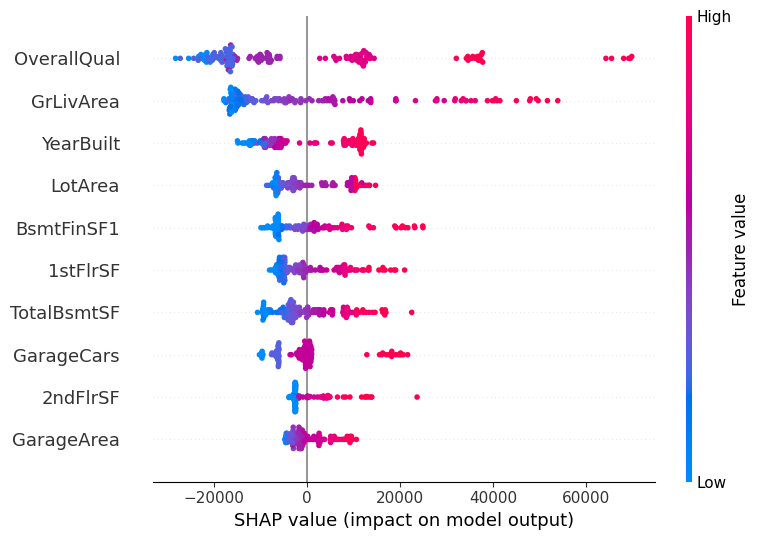

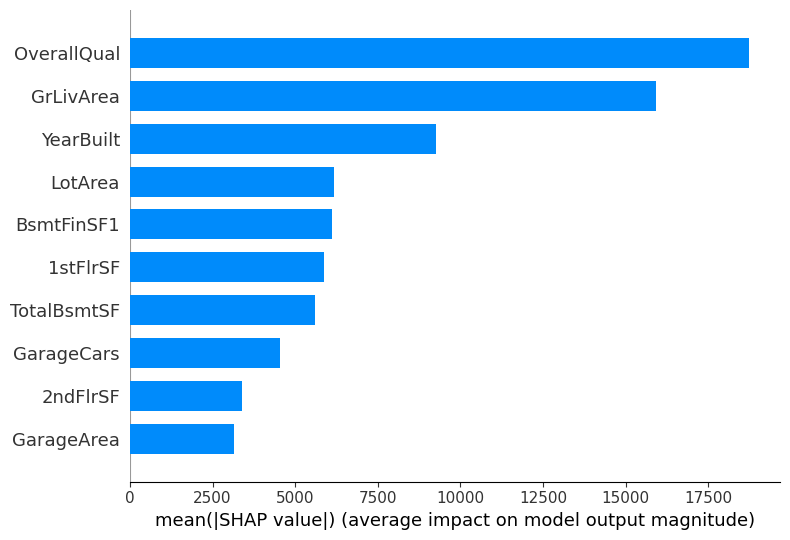

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,4
final_validation_loss,29507.53964
learning_rate,0.01


wandb: Agent Starting Run: 1cb3yp7u with config:
wandb: 	dataset_name: Standard_RFE
wandb: 	depth: 4
wandb: 	learning_rate: 0.05


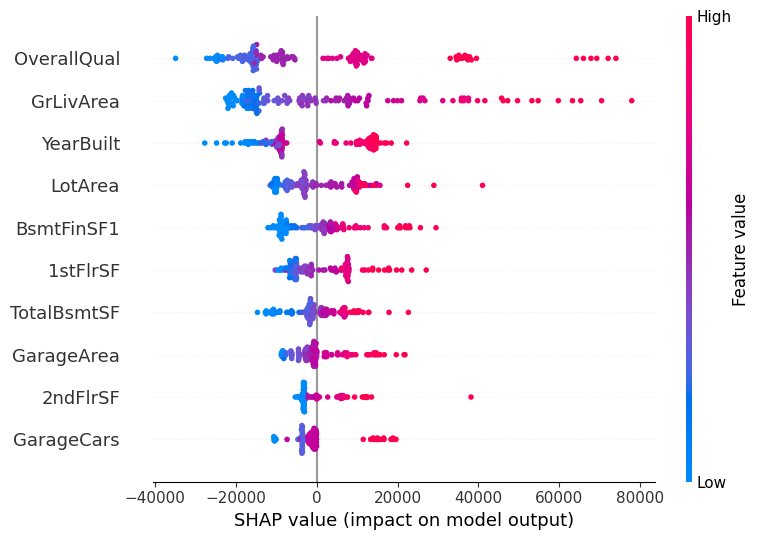

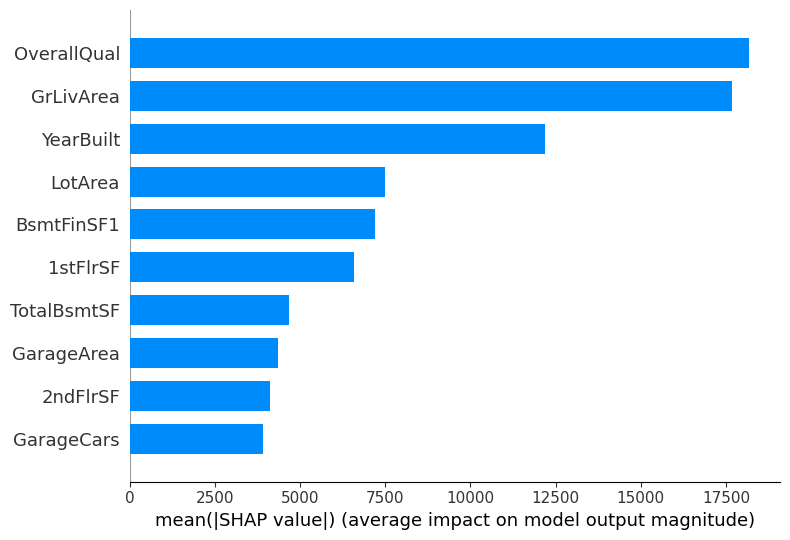

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,4
final_validation_loss,27205.33395
learning_rate,0.05


wandb: Agent Starting Run: qfo6vpdx with config:
wandb: 	dataset_name: Standard_RFE
wandb: 	depth: 6
wandb: 	learning_rate: 0.01


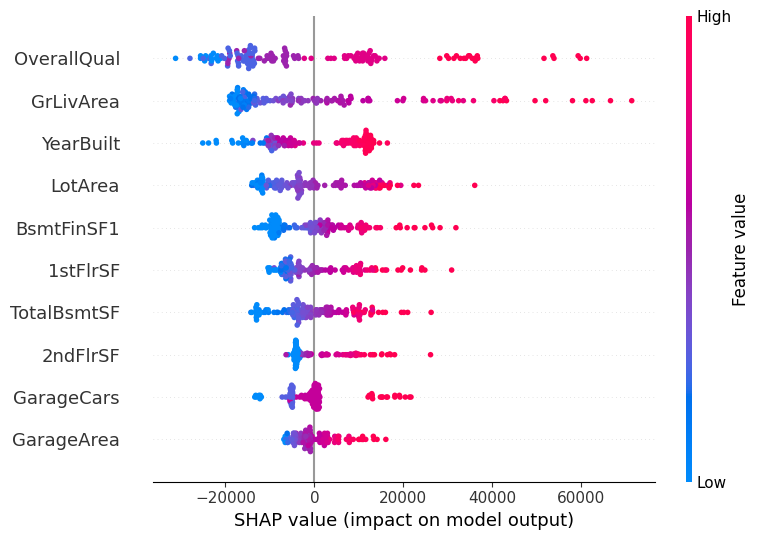

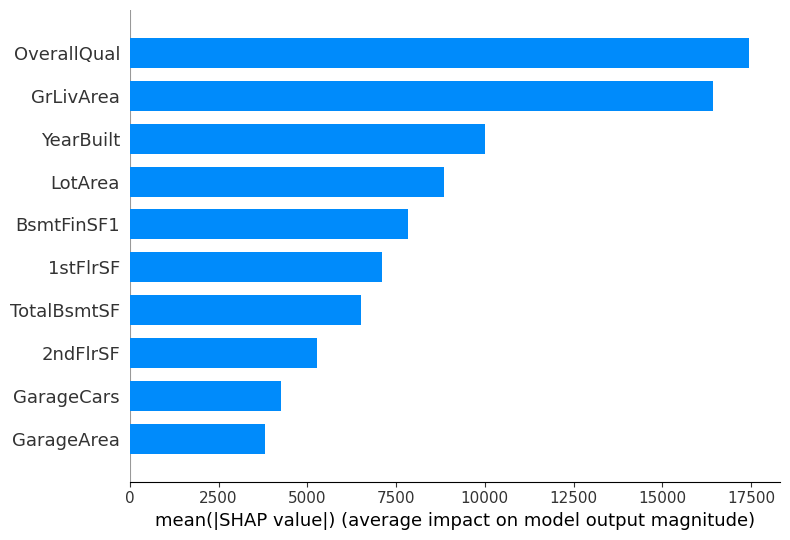

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,6
final_validation_loss,26767.50191
learning_rate,0.01


wandb: Agent Starting Run: 20iscfxv with config:
wandb: 	dataset_name: Standard_RFE
wandb: 	depth: 6
wandb: 	learning_rate: 0.05


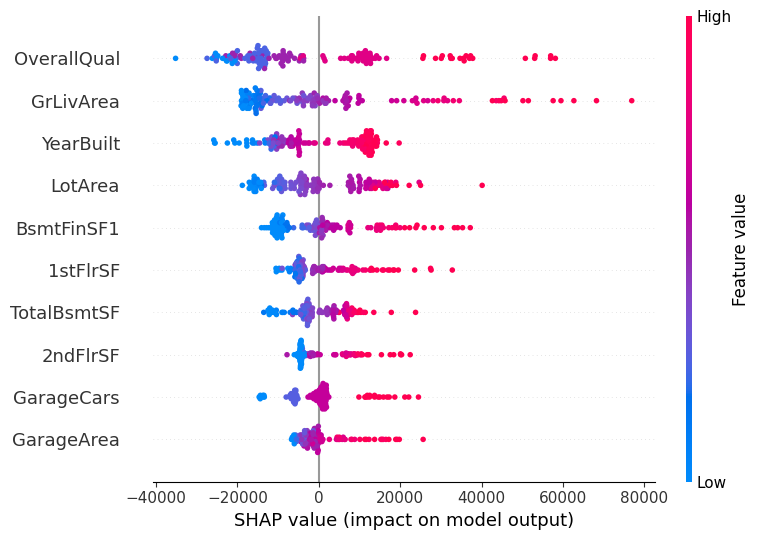

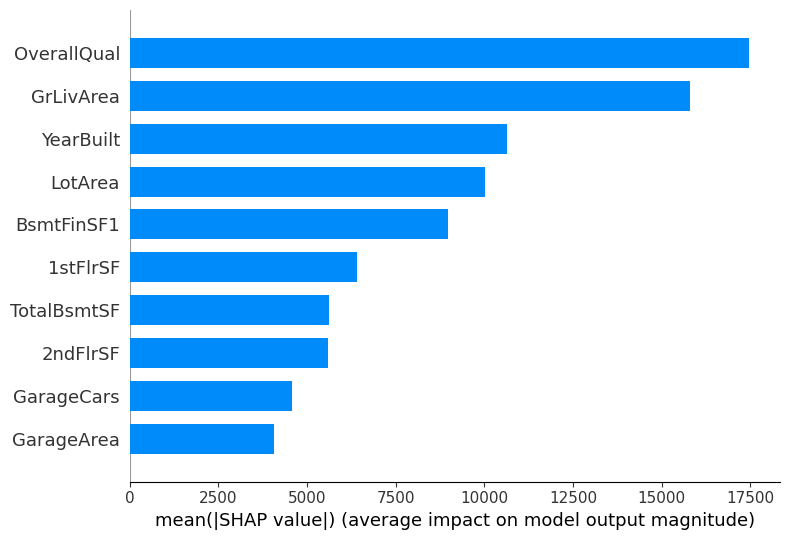

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,6
final_validation_loss,26916.00504
learning_rate,0.05


wandb: Agent Starting Run: ehfh1ujl with config:
wandb: 	dataset_name: Standard_PCA
wandb: 	depth: 4
wandb: 	learning_rate: 0.01


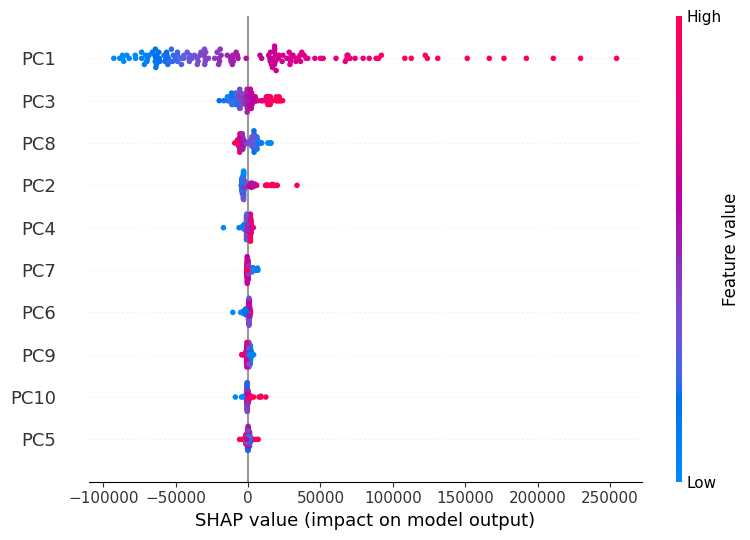

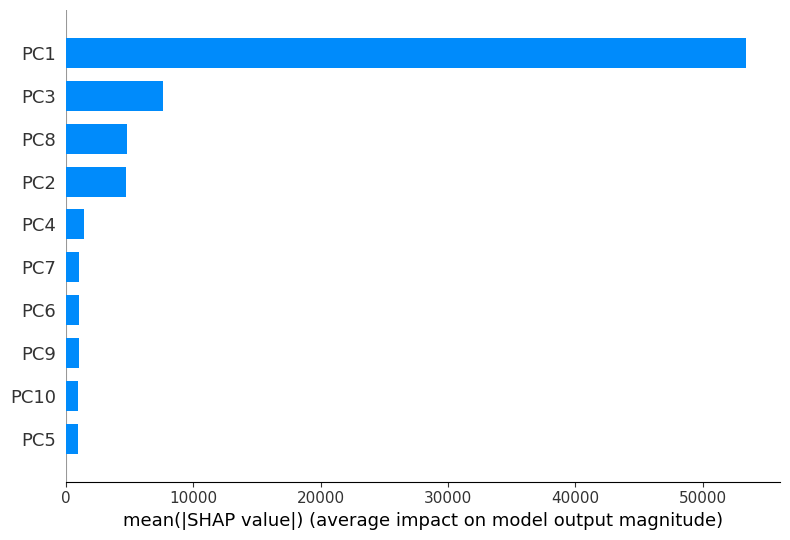

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,4
final_validation_loss,26740.44676
learning_rate,0.01


wandb: Agent Starting Run: ffz1hvr3 with config:
wandb: 	dataset_name: Standard_PCA
wandb: 	depth: 4
wandb: 	learning_rate: 0.05


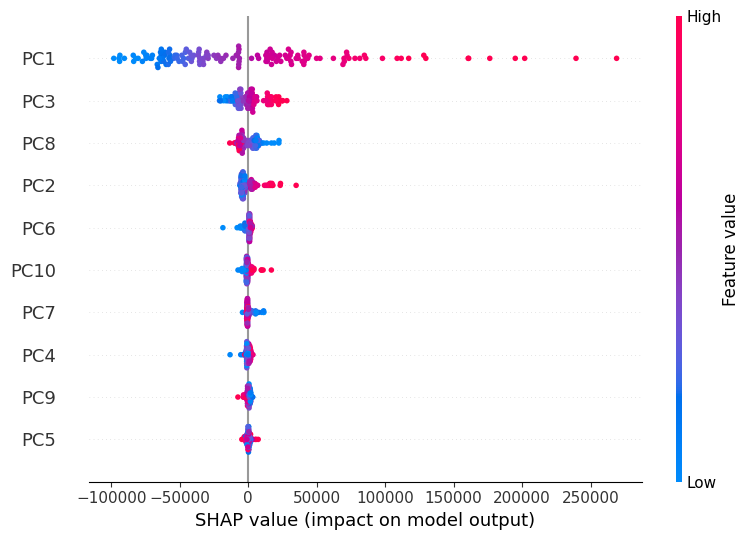

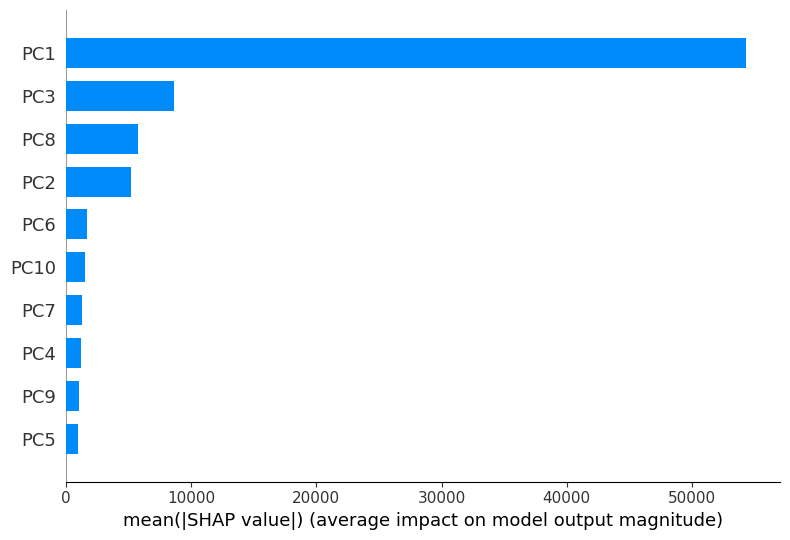

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,4
final_validation_loss,26345.6495
learning_rate,0.05


wandb: Agent Starting Run: 67q8twen with config:
wandb: 	dataset_name: Standard_PCA
wandb: 	depth: 6
wandb: 	learning_rate: 0.01


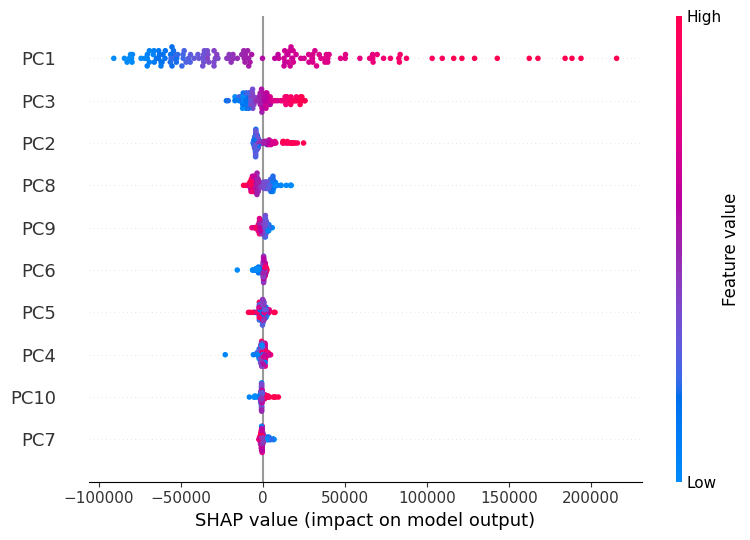

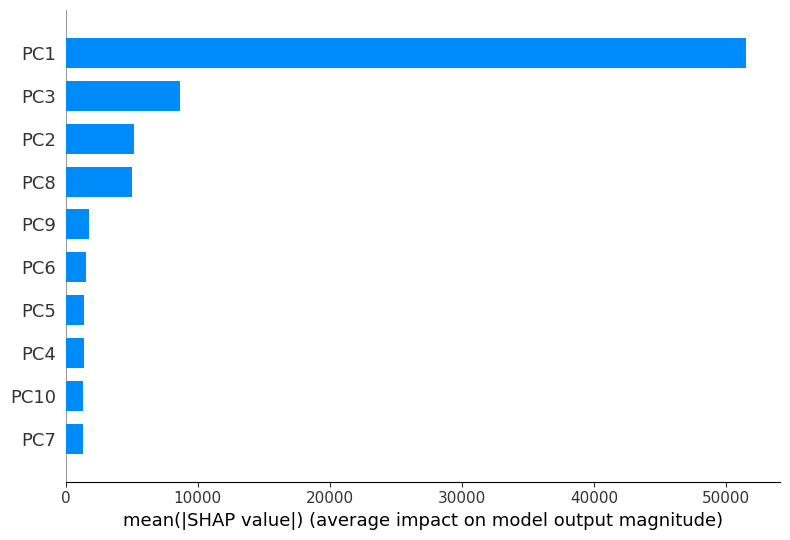

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,6
final_validation_loss,27097.32268
learning_rate,0.01


wandb: Agent Starting Run: n7tk9sd3 with config:
wandb: 	dataset_name: Standard_PCA
wandb: 	depth: 6
wandb: 	learning_rate: 0.05


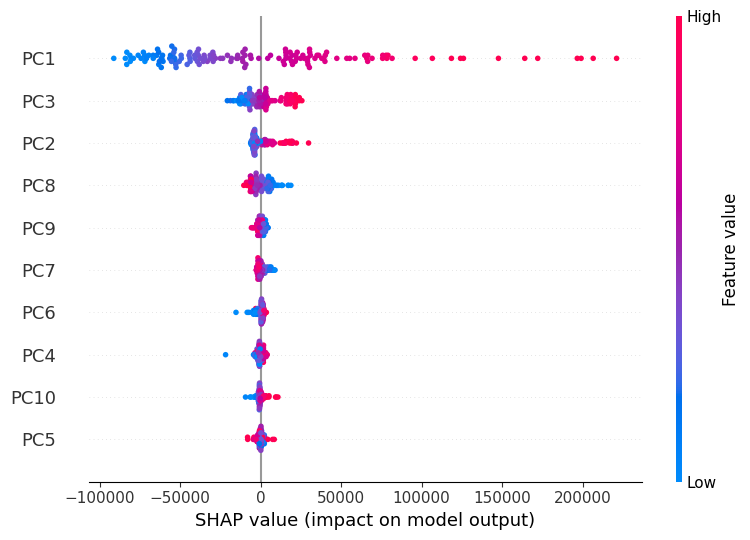

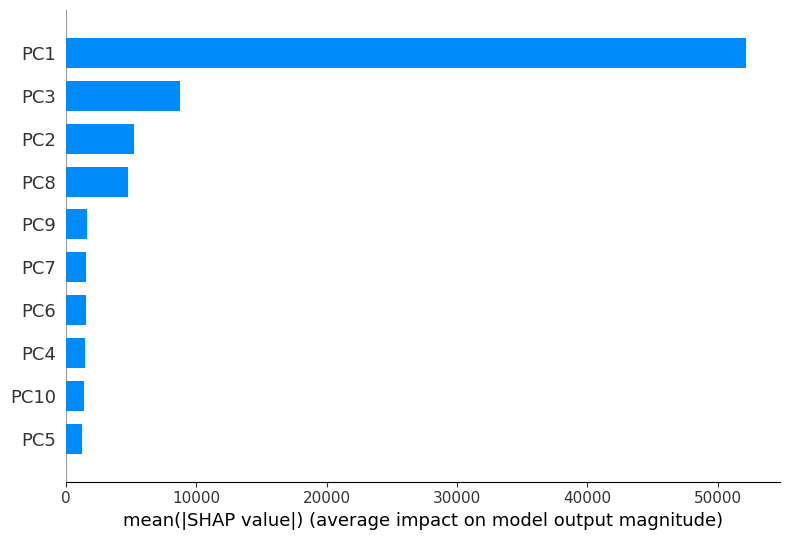

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,6
final_validation_loss,27394.19487
learning_rate,0.05


wandb: Agent Starting Run: 4huv6jtm with config:
wandb: 	dataset_name: MinMax_RFE
wandb: 	depth: 4
wandb: 	learning_rate: 0.01


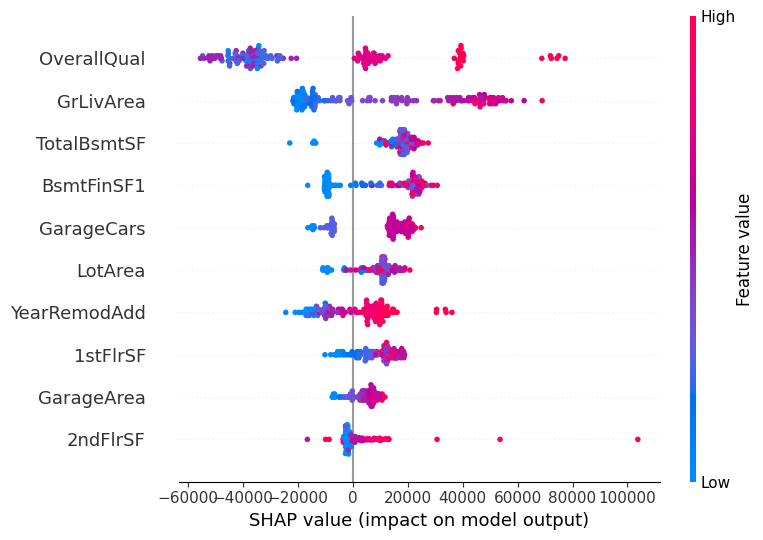

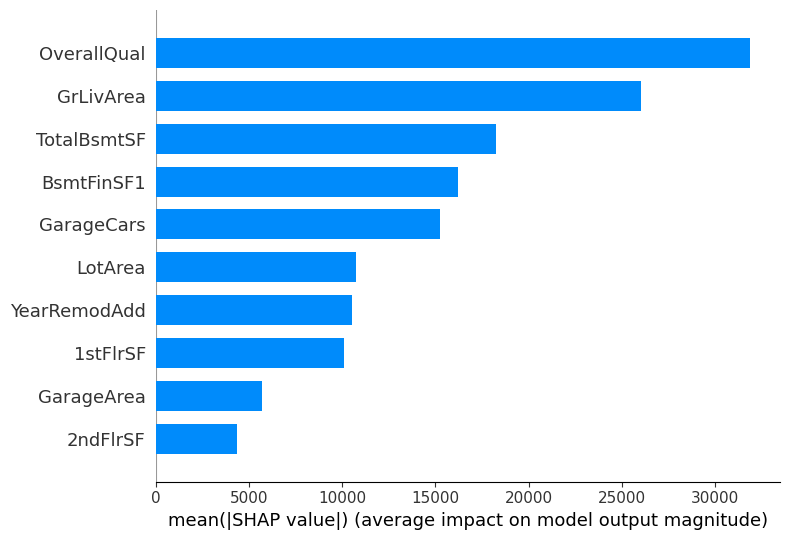

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,4
final_validation_loss,26926.3995
learning_rate,0.01


wandb: Agent Starting Run: s428auyl with config:
wandb: 	dataset_name: MinMax_RFE
wandb: 	depth: 4
wandb: 	learning_rate: 0.05


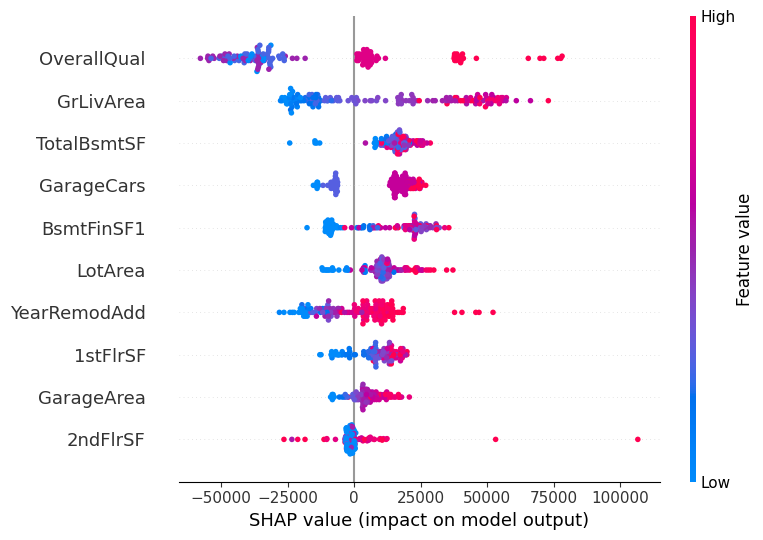

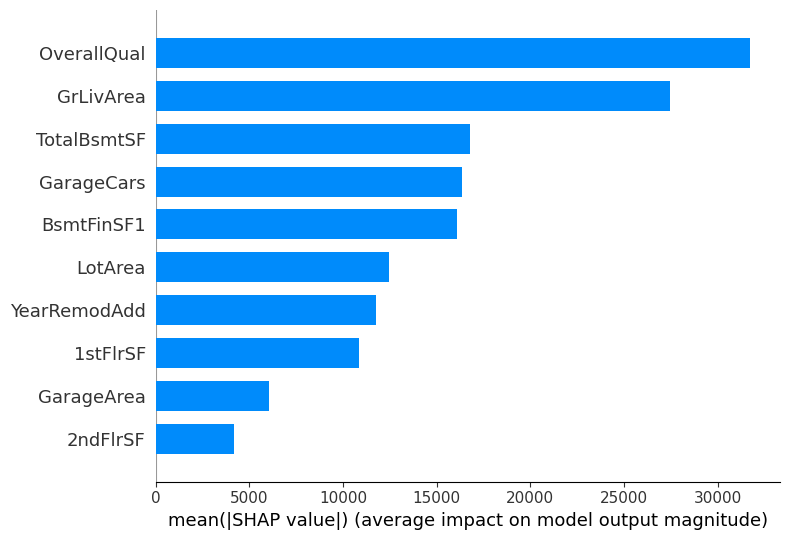

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,4
final_validation_loss,26629.99359
learning_rate,0.05


wandb: Agent Starting Run: uw5sh9m9 with config:
wandb: 	dataset_name: MinMax_RFE
wandb: 	depth: 6
wandb: 	learning_rate: 0.01


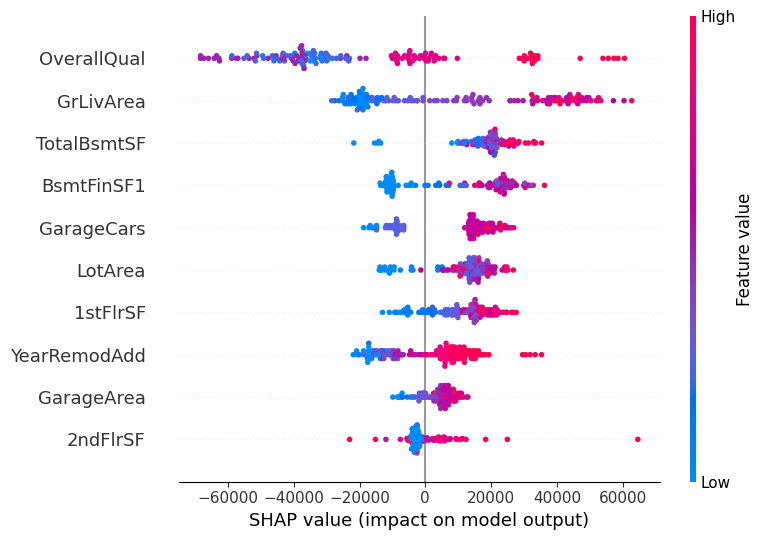

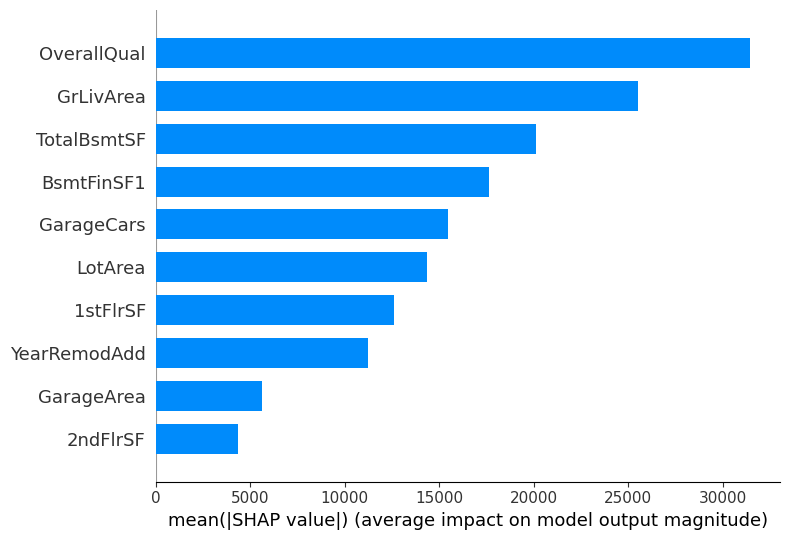

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,6
final_validation_loss,26382.36945
learning_rate,0.01


wandb: Agent Starting Run: uwgftvm1 with config:
wandb: 	dataset_name: MinMax_RFE
wandb: 	depth: 6
wandb: 	learning_rate: 0.05


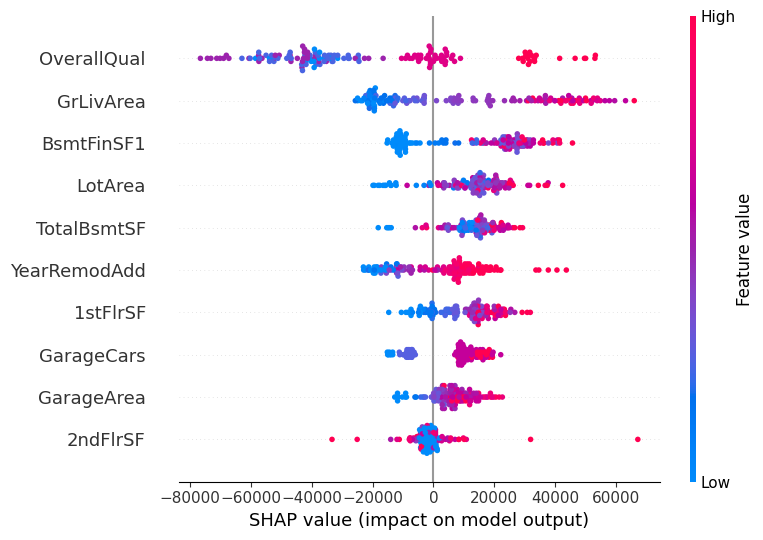

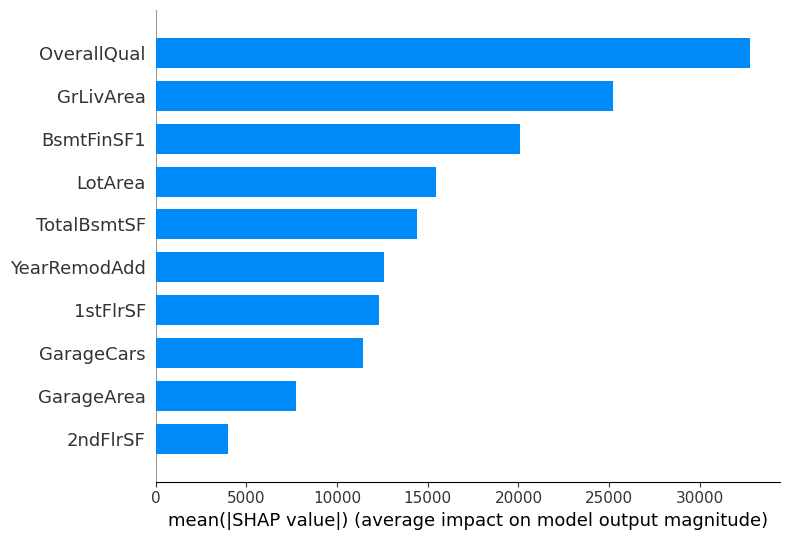

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,6
final_validation_loss,26110.47778
learning_rate,0.05


wandb: Agent Starting Run: sxhvywxy with config:
wandb: 	dataset_name: MinMax_PCA
wandb: 	depth: 4
wandb: 	learning_rate: 0.01


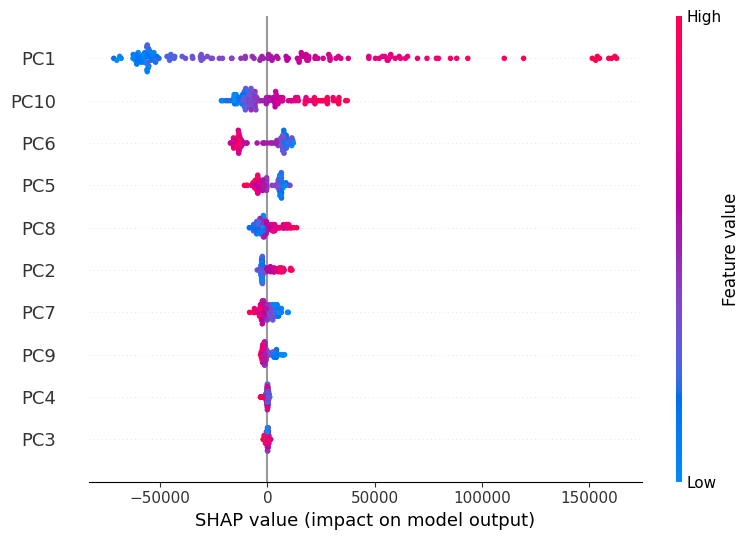

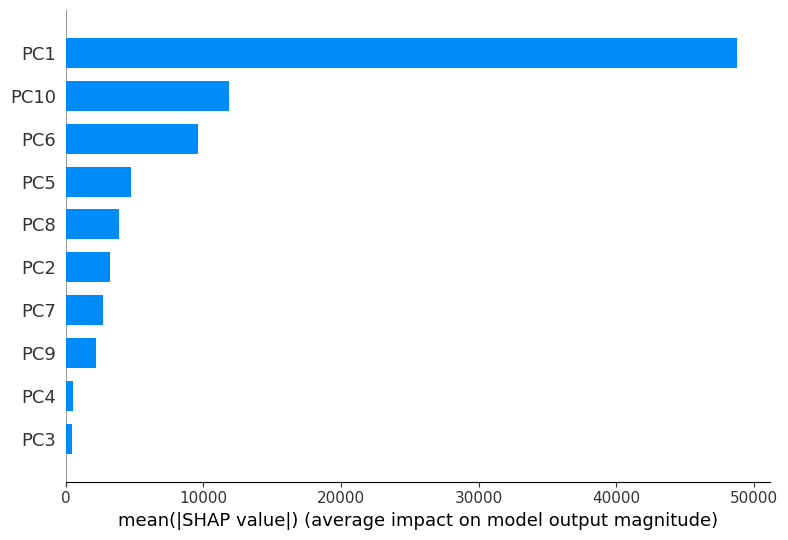

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,4
final_validation_loss,39030.32949
learning_rate,0.01


wandb: Agent Starting Run: xvfwbwf3 with config:
wandb: 	dataset_name: MinMax_PCA
wandb: 	depth: 4
wandb: 	learning_rate: 0.05


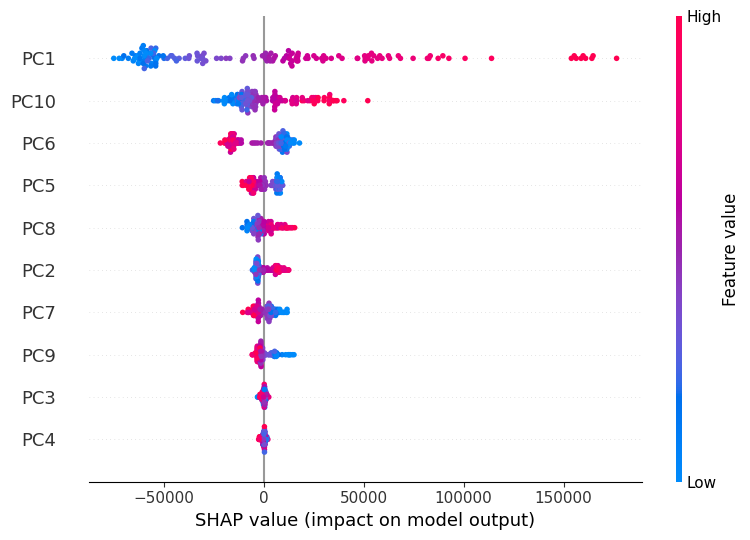

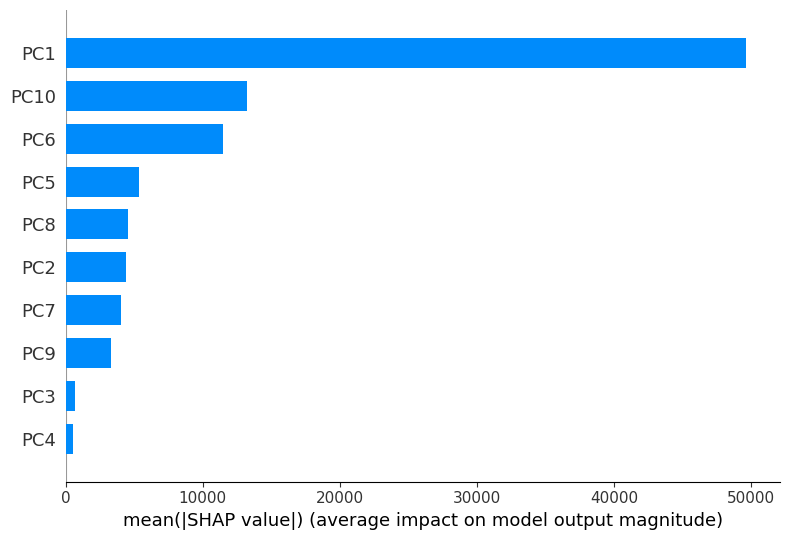

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,4
final_validation_loss,37632.85478
learning_rate,0.05


wandb: Agent Starting Run: zc36ykr1 with config:
wandb: 	dataset_name: MinMax_PCA
wandb: 	depth: 6
wandb: 	learning_rate: 0.01


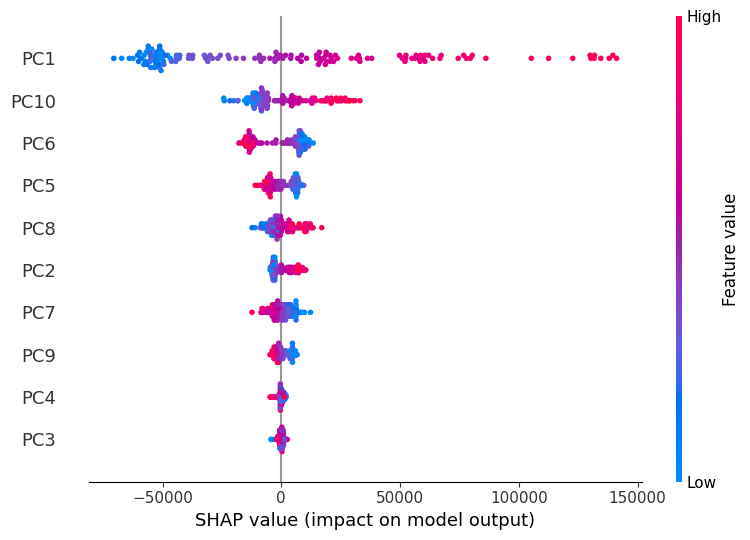

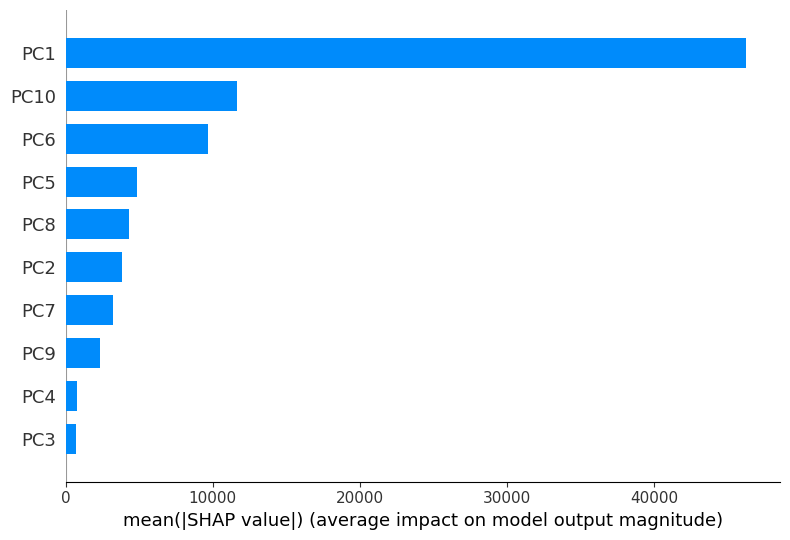

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,6
final_validation_loss,39228.58906
learning_rate,0.01


wandb: Agent Starting Run: 17s6sl7r with config:
wandb: 	dataset_name: MinMax_PCA
wandb: 	depth: 6
wandb: 	learning_rate: 0.05


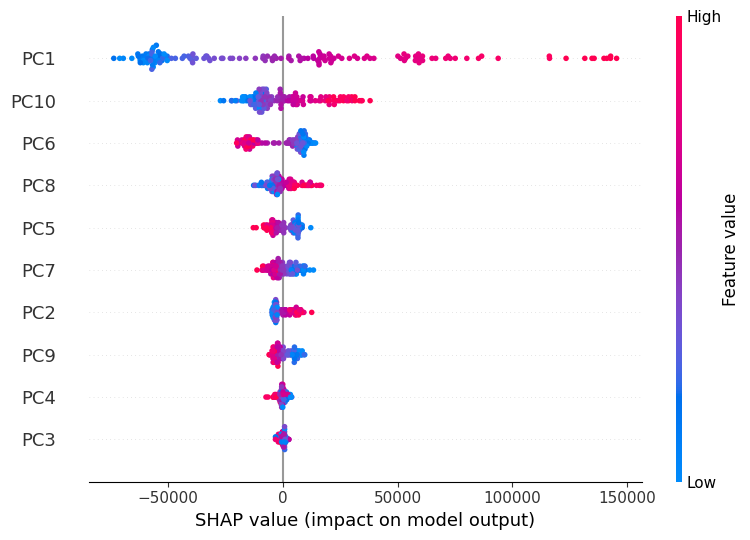

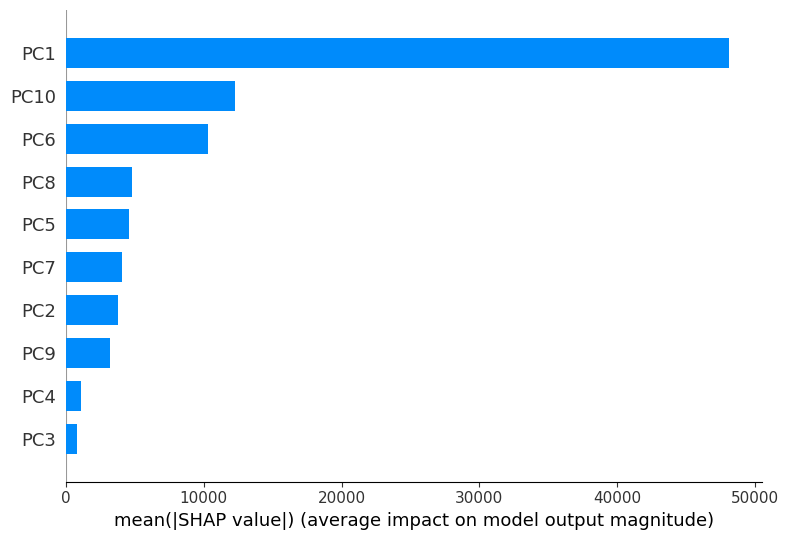

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,6
final_validation_loss,38623.40626
learning_rate,0.05


wandb: Agent Starting Run: zqk5icch with config:
wandb: 	dataset_name: Log_RFE
wandb: 	depth: 4
wandb: 	learning_rate: 0.01


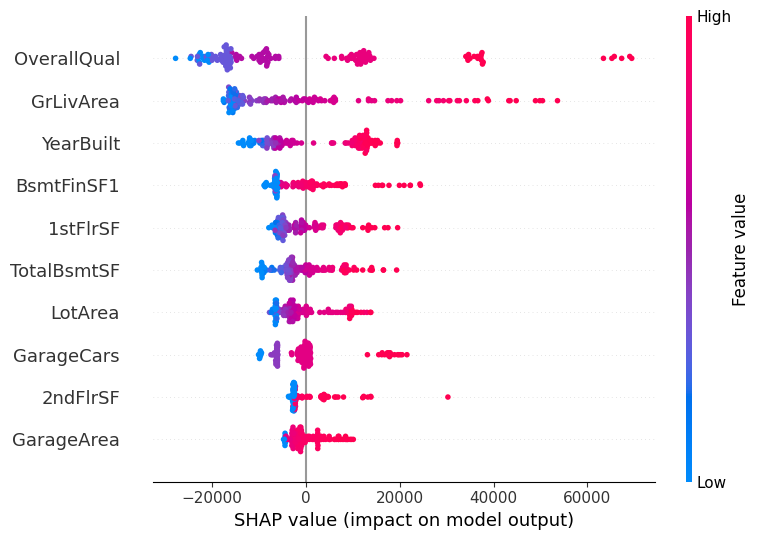

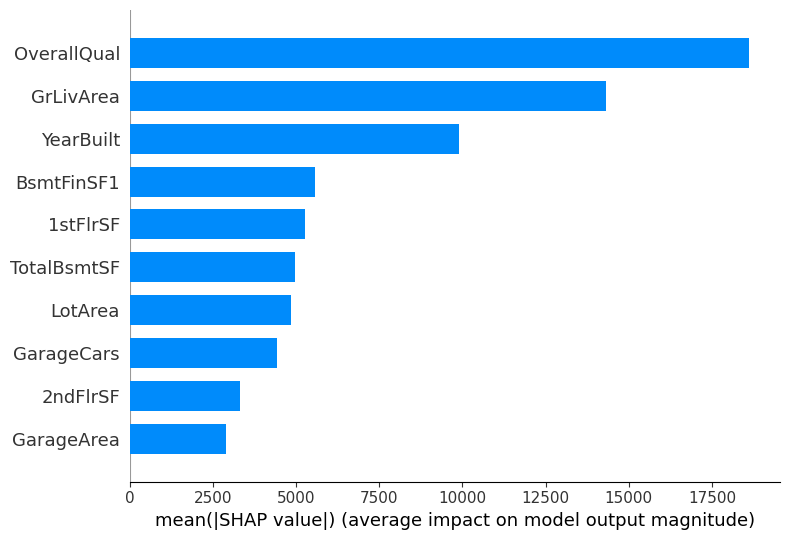

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,4
final_validation_loss,29507.82447
learning_rate,0.01


wandb: Agent Starting Run: ekfwj6hc with config:
wandb: 	dataset_name: Log_RFE
wandb: 	depth: 4
wandb: 	learning_rate: 0.05


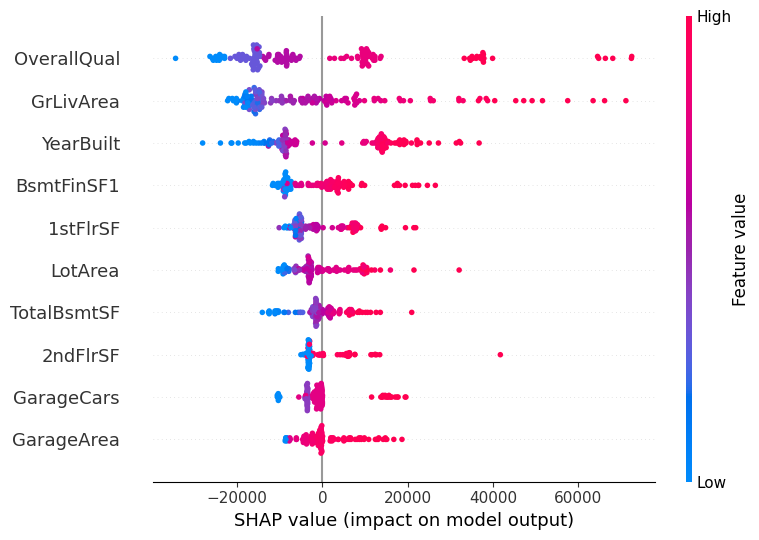

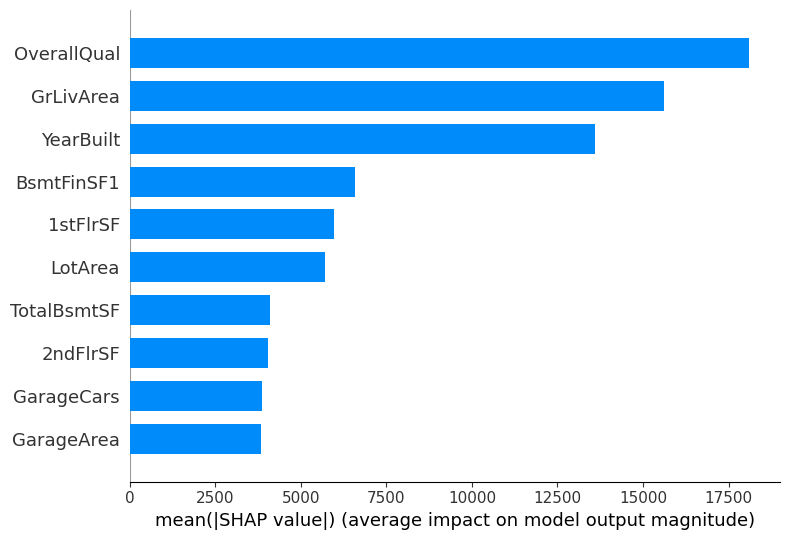

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,4
final_validation_loss,27184.73949
learning_rate,0.05


wandb: Agent Starting Run: h8r1lpqw with config:
wandb: 	dataset_name: Log_RFE
wandb: 	depth: 6
wandb: 	learning_rate: 0.01


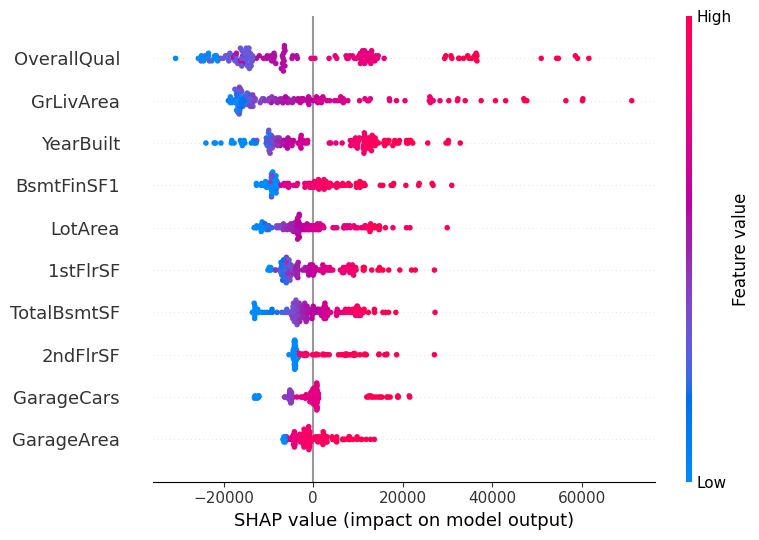

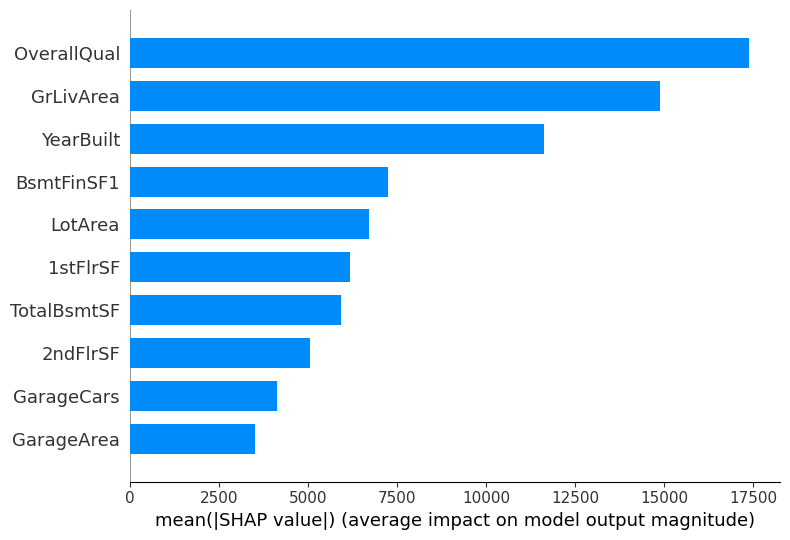

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,6
final_validation_loss,26776.17611
learning_rate,0.01


wandb: Agent Starting Run: u7yifctk with config:
wandb: 	dataset_name: Log_RFE
wandb: 	depth: 6
wandb: 	learning_rate: 0.05


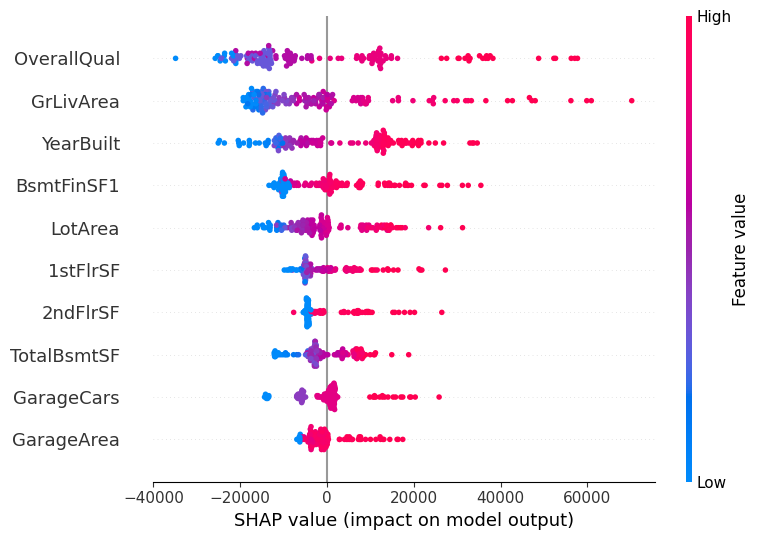

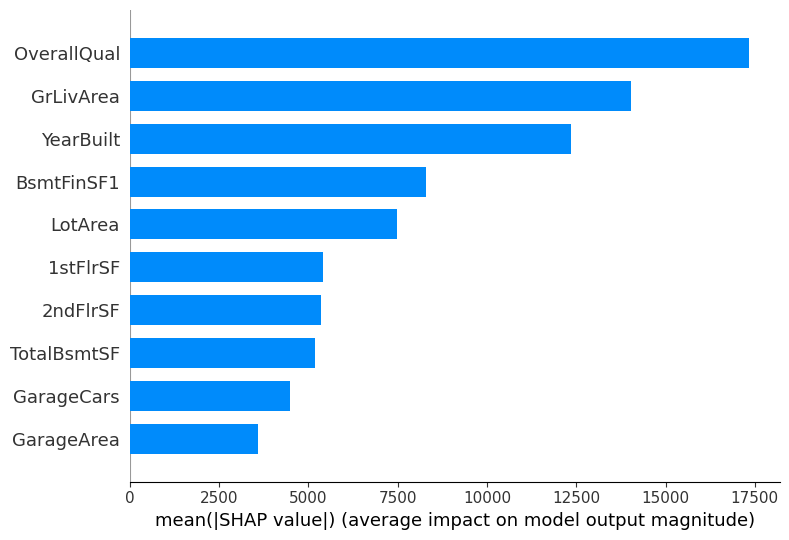

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,6
final_validation_loss,26917.00784
learning_rate,0.05


wandb: Agent Starting Run: 3zoh3ca8 with config:
wandb: 	dataset_name: Log_PCA
wandb: 	depth: 4
wandb: 	learning_rate: 0.01


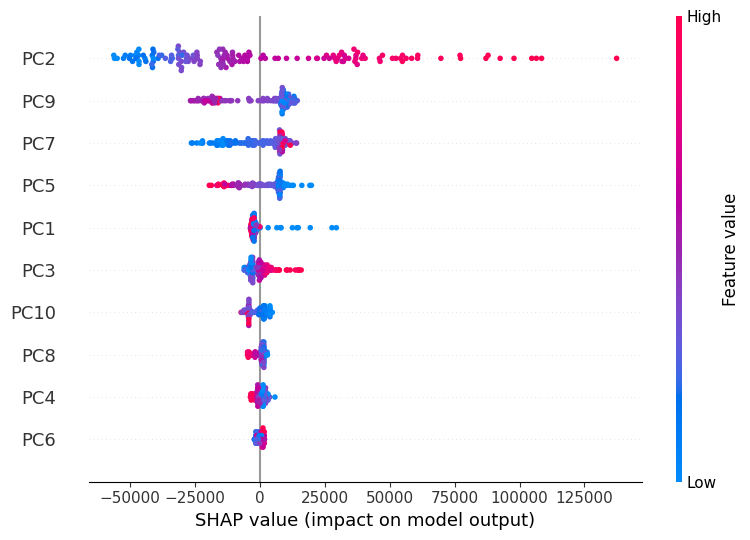

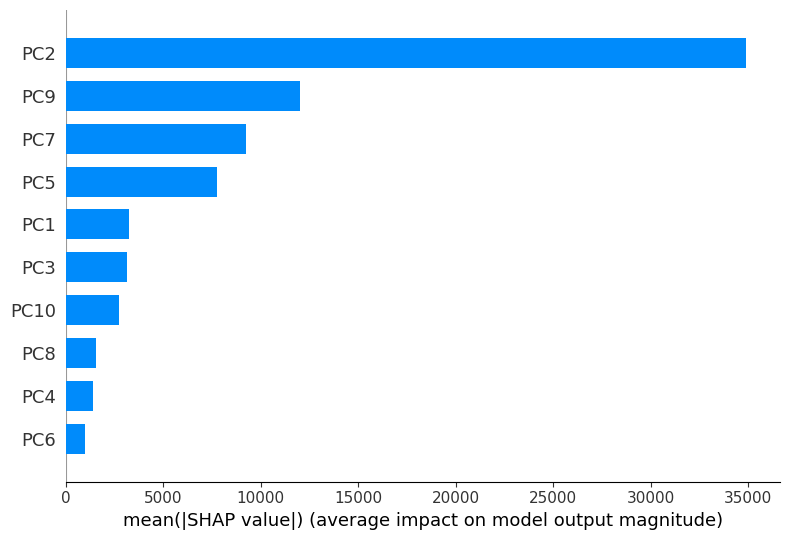

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,4
final_validation_loss,49345.72284
learning_rate,0.01


wandb: Agent Starting Run: xrhuwdps with config:
wandb: 	dataset_name: Log_PCA
wandb: 	depth: 4
wandb: 	learning_rate: 0.05


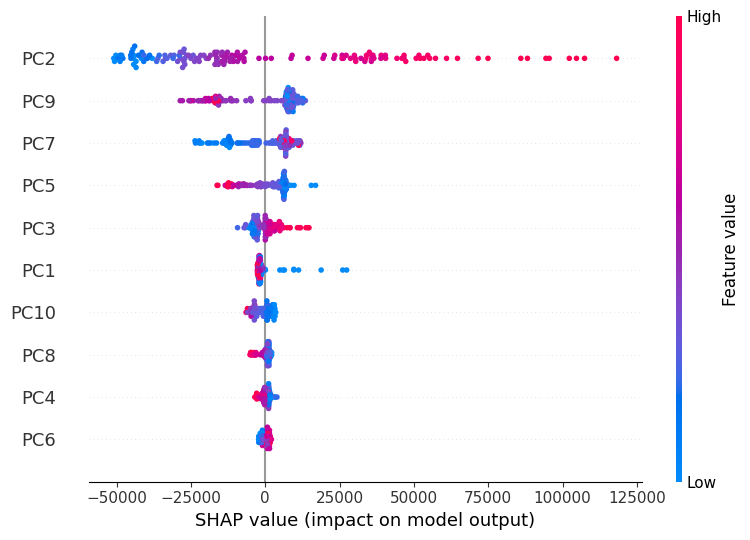

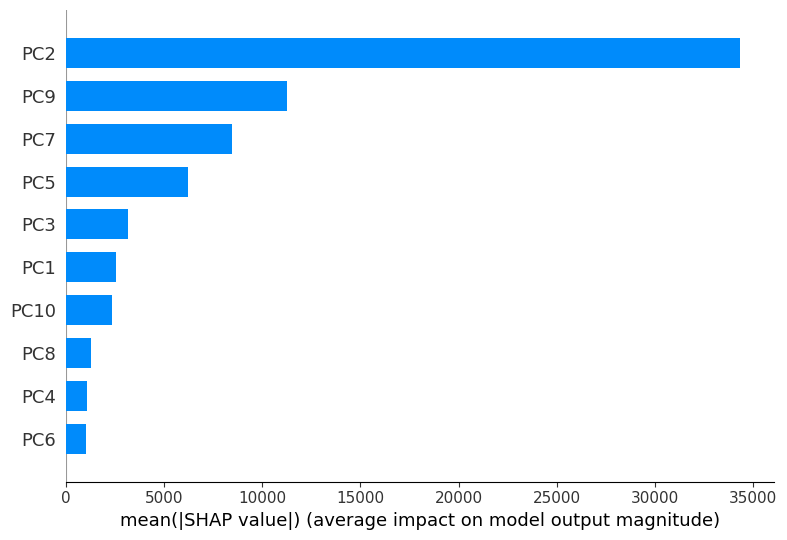

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,4
final_validation_loss,50008.2878
learning_rate,0.05


wandb: Agent Starting Run: skxupdut with config:
wandb: 	dataset_name: Log_PCA
wandb: 	depth: 6
wandb: 	learning_rate: 0.01


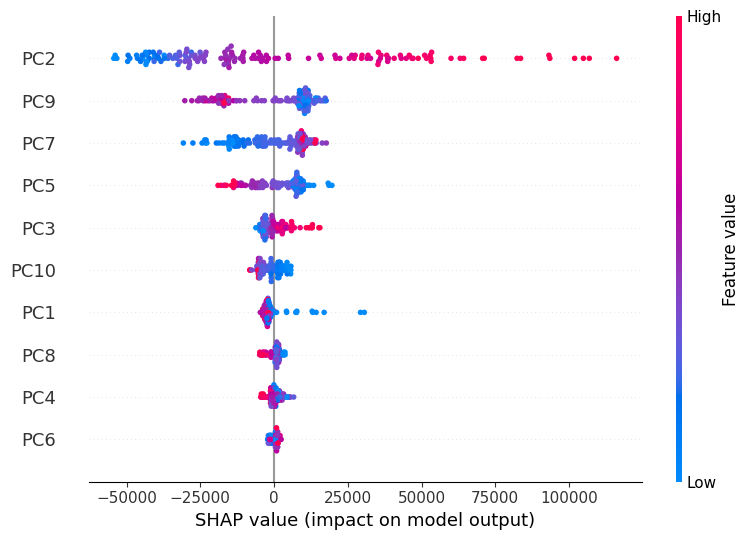

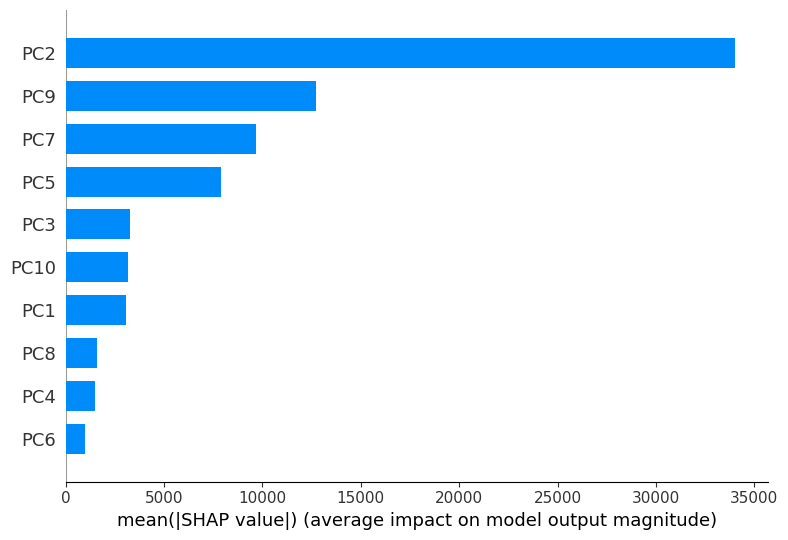

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,6
final_validation_loss,48408.77901
learning_rate,0.01


wandb: Agent Starting Run: zyada569 with config:
wandb: 	dataset_name: Log_PCA
wandb: 	depth: 6
wandb: 	learning_rate: 0.05


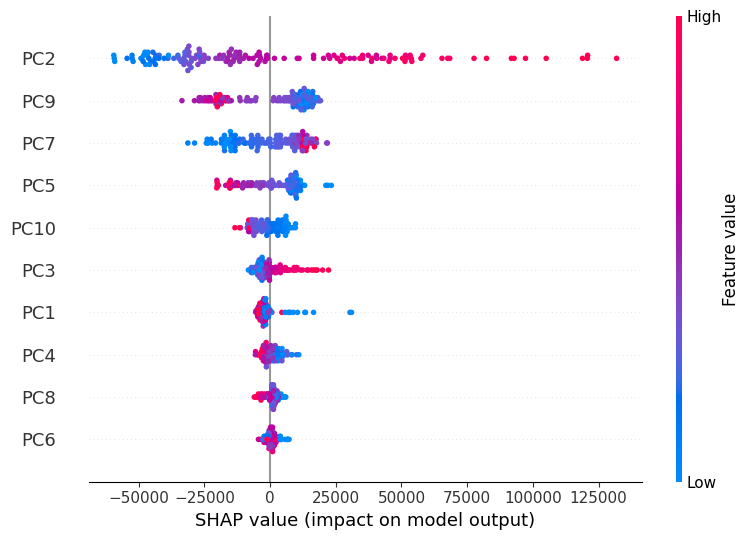

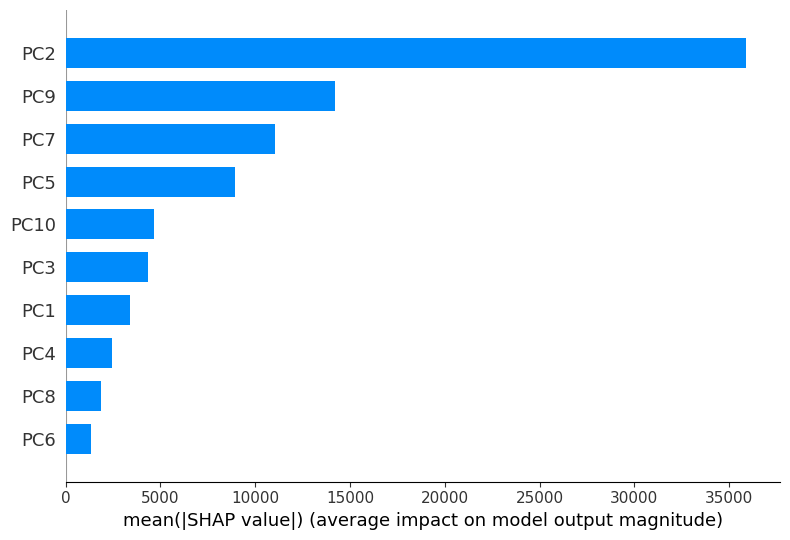

depth,▁
final_validation_loss,▁
learning_rate,▁
depth,6
final_validation_loss,47926.27843
learning_rate,0.05


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


╒══════════════╤═════════════════╤═════════╤═════════╤═══════════╤══════════╕
│ Dataset      │   Learning Rate │   Depth │    RMSE │        R2 │     MAPE │
╞══════════════╪═════════════════╪═════════╪═════════╪═══════════╪══════════╡
│ Standard_RFE │            0.01 │       4 │ 27109.8 │ 0.867851  │ 10.7309  │
├──────────────┼─────────────────┼─────────┼─────────┼───────────┼──────────┤
│ Standard_RFE │            0.05 │       4 │ 26192.7 │ 0.876641  │ 10.3899  │
├──────────────┼─────────────────┼─────────┼─────────┼───────────┼──────────┤
│ Standard_RFE │            0.01 │       6 │ 25740.5 │ 0.880864  │ 10.0986  │
├──────────────┼─────────────────┼─────────┼─────────┼───────────┼──────────┤
│ Standard_RFE │            0.05 │       6 │ 25537.7 │ 0.882734  │  9.95418 │
├──────────────┼─────────────────┼─────────┼─────────┼───────────┼──────────┤
│ Standard_PCA │            0.01 │       4 │ 25503.9 │ 0.883044  │ 11.0552  │
├──────────────┼─────────────────┼─────────┼─────────┼──────────

In [ ]:
import wandb
from catboost import CatBoostRegressor, Pool
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from tabulate import tabulate
import shap
import matplotlib.pyplot as plt

# Define the datasets
datasets = {
    "Standard_RFE": (df_train_standard_rfe, df_test_standard_rfe),
    "Standard_PCA": (df_train_standard_pca, df_test_standard_pca),
    "MinMax_RFE": (df_train_minmax_rfe, df_test_minmax_rfe),
    "MinMax_PCA": (df_train_minmax_pca, df_test_minmax_pca),
    "Log_RFE": (df_train_log_rfe, df_test_log_rfe),
    "Log_PCA": (df_train_log_pca, df_test_log_pca)
}

# Define the sweep configuration
sweep_config = {
    'method': 'grid',
    'parameters': {
        'learning_rate': {
            'values': [0.01, 0.05]
        },
        'depth': {
            'values': [4, 6]
        },
        'dataset_name': {
            'values': list(datasets.keys())
        }
    }
}

# Initialize W&B project
sweep_id = wandb.sweep(sweep_config, project="IS580-TermProject-Catboost")

# Initialize results list
results_list = []

# Define a callback class for logging metrics to W&B
class WandbLogger:
    def after_iteration(self, info):
        if hasattr(info, 'iteration') and hasattr(info, 'learn') and hasattr(info, 'validation'):
            wandb.log({
                "epoch": info.iteration,
                "validation_loss": info.validation.rmse
            })
        return True

# Define a function for training and evaluating the model
def train():
    # Initialize a new W&B run
    wandb.init()

    # Get hyperparameters from W&B config
    lr = wandb.config.learning_rate
    depth = wandb.config.depth
    dataset_name = wandb.config.dataset_name

    train_data, test_data = datasets[dataset_name]

    # Split train_data into train and validation sets
    train_data.reset_index(drop=True, inplace=True)
    test_data.reset_index(drop=True, inplace=True)
    np.random.shuffle(train_data.values)
    train_size = int(0.8 * len(train_data))
    train_set = train_data[:train_size]
    val_set = train_data[train_size:]

    # Extract features and target variable
    X_train, y_train = train_set.drop(columns=["SalePrice"]), train_set["SalePrice"]
    X_val, y_val = val_set.drop(columns=["SalePrice"]), val_set["SalePrice"]
    X_test, y_test = test_data.drop(columns=["SalePrice"]), test_data["SalePrice"]

    # Initialize CatBoost regressor
    model = CatBoostRegressor(loss_function='RMSE', eval_metric='RMSE', random_seed=42, logging_level='Silent',
                              learning_rate=lr, depth=depth)

    # Train the model with the WandbLogger callback
    model.fit(X_train, y_train, eval_set=(X_val, y_val), early_stopping_rounds=5, verbose=False,
              callbacks=[WandbLogger()])

    # Get validation loss
    val_loss = model.get_best_score()['validation']['RMSE']

    # Log hyperparameters and final validation loss to W&B
    wandb.log({"learning_rate": lr, "depth": depth, "final_validation_loss": val_loss})

    # Evaluate on test set
    test_preds = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, test_preds))
    r2 = r2_score(y_test, test_preds)
    mape = np.mean(np.abs((y_test - test_preds) / y_test)) * 100

    # Print SHAP values and plots
    explainer = shap.Explainer(model)
    shap_values = explainer(X_test)
    shap.summary_plot(shap_values, X_test)
    shap.summary_plot(shap_values, X_test, plot_type="bar")

    # Append results to the list
    results_list.append([dataset_name, lr, depth, rmse, r2, mape])

    # Finish the W&B run
    wandb.finish()

# Initialize and run the sweep
wandb.agent(sweep_id, function=train)

# Print results in tabular format
headers = ["Dataset", "Learning Rate", "Depth", "RMSE", "R2", "MAPE"]
print(tabulate(results_list, headers=headers, tablefmt="fancy_grid"))

### Random Forest Model

Create sweep with ID: 2svf1zse
Sweep URL: https://wandb.ai/engindenizerkan/IS580-TermProject-RandomForest/sweeps/2svf1zse


wandb: Agent Starting Run: 4731s7tv with config:
wandb: 	dataset_name: Standard_RFE
wandb: 	max_depth: 4
wandb: 	n_estimators: 50


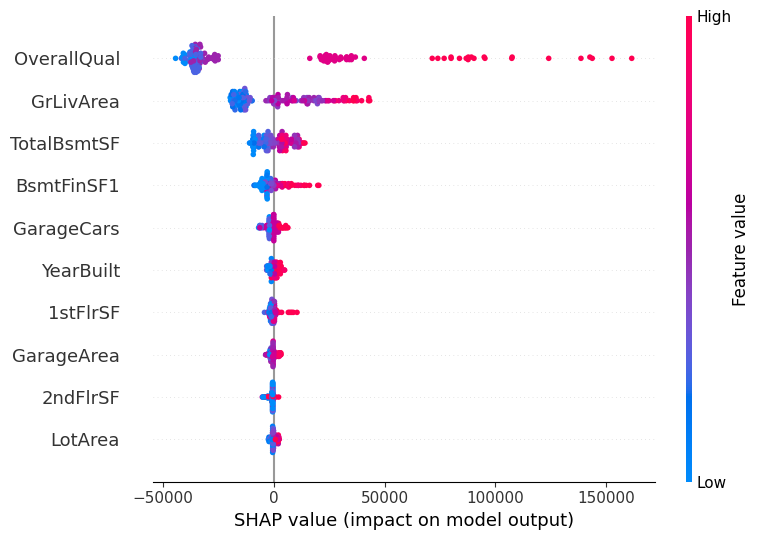

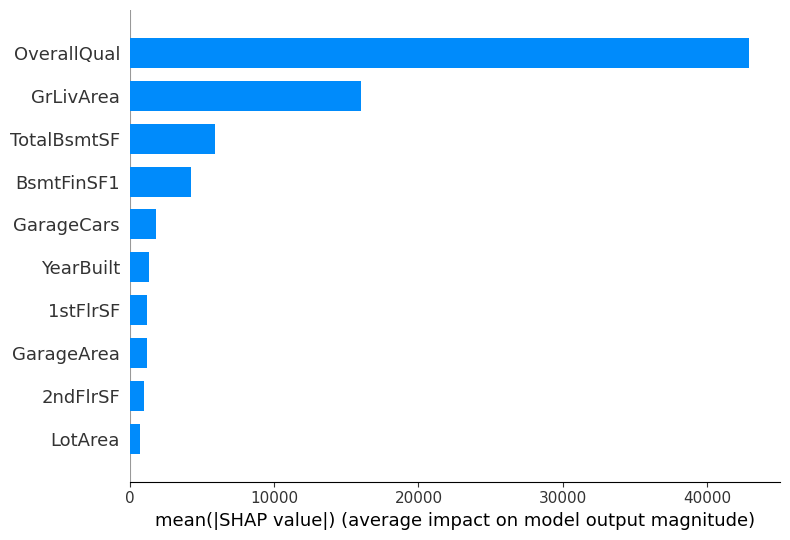

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,32581.40401
max_depth,4
n_estimators,50


wandb: Agent Starting Run: 9gcss7tn with config:
wandb: 	dataset_name: Standard_RFE
wandb: 	max_depth: 4
wandb: 	n_estimators: 100


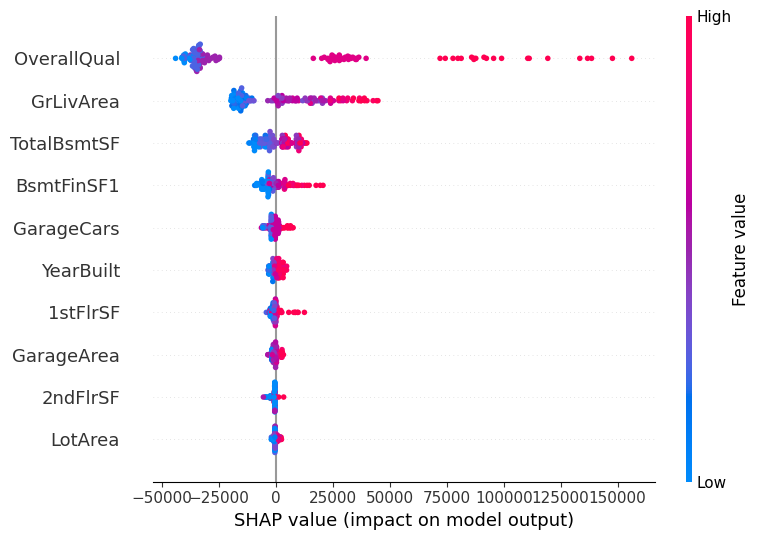

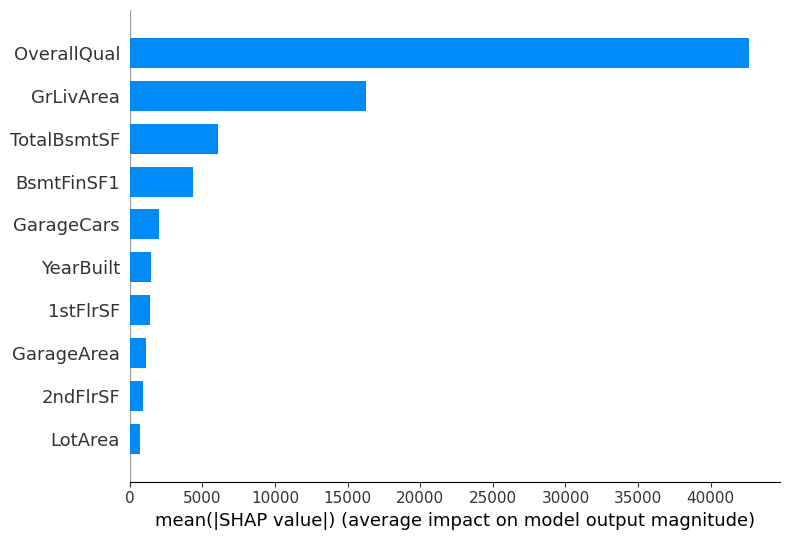

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,32412.62238
max_depth,4
n_estimators,100


wandb: Agent Starting Run: h7rlwyvc with config:
wandb: 	dataset_name: Standard_RFE
wandb: 	max_depth: 6
wandb: 	n_estimators: 50


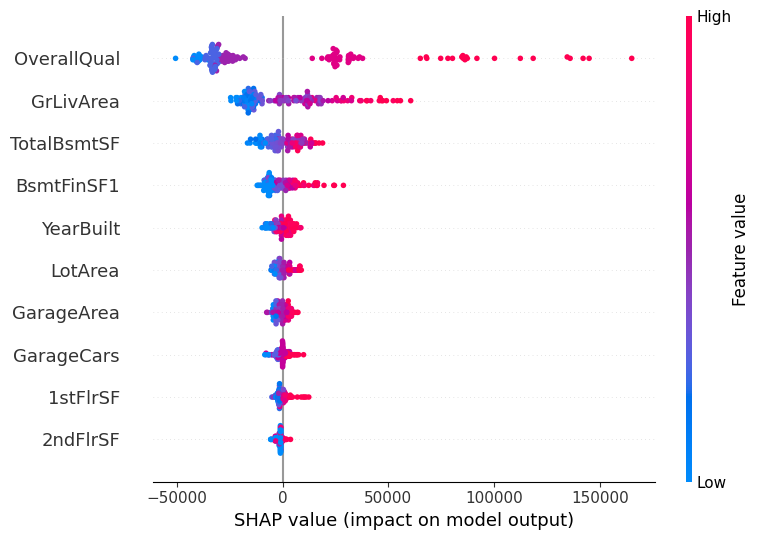

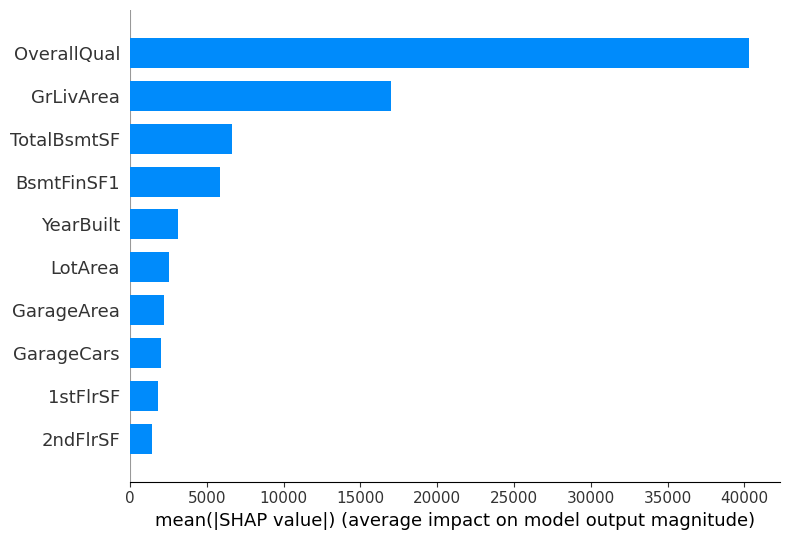

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,28294.26387
max_depth,6
n_estimators,50


wandb: Agent Starting Run: xc6j2d1a with config:
wandb: 	dataset_name: Standard_RFE
wandb: 	max_depth: 6
wandb: 	n_estimators: 100


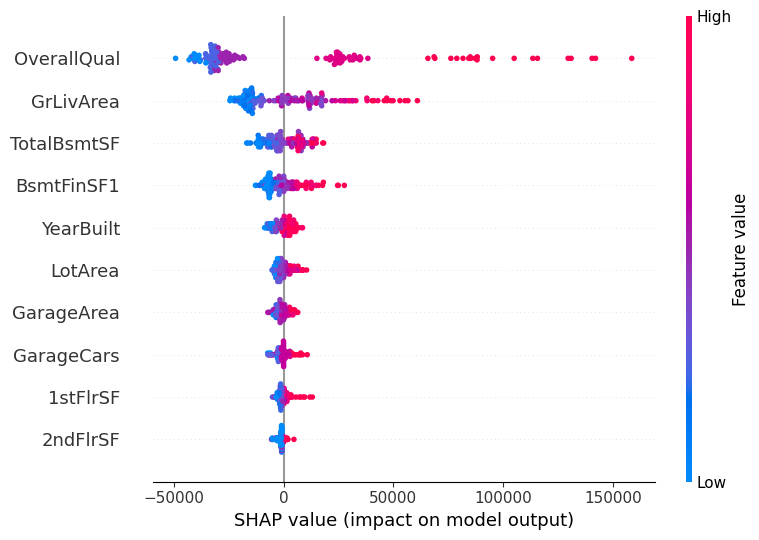

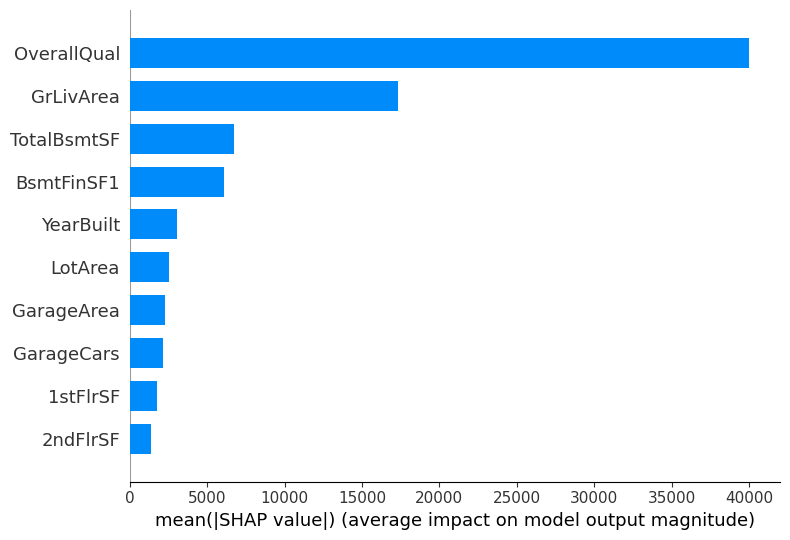

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,28161.22827
max_depth,6
n_estimators,100


wandb: Agent Starting Run: psbdeuon with config:
wandb: 	dataset_name: Standard_PCA
wandb: 	max_depth: 4
wandb: 	n_estimators: 50


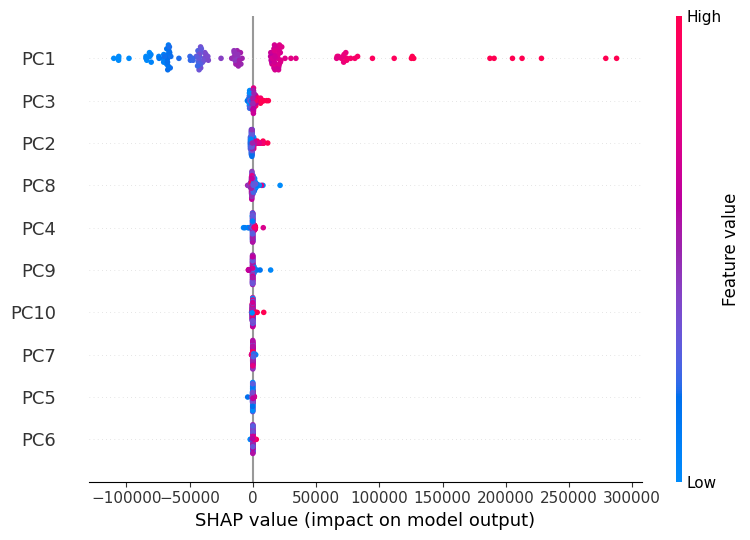

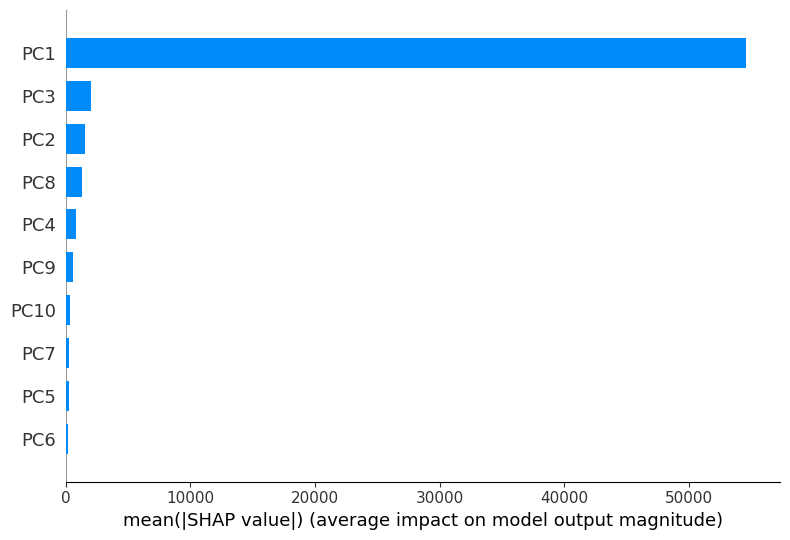

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,33978.50699
max_depth,4
n_estimators,50


wandb: Agent Starting Run: fpca6w9a with config:
wandb: 	dataset_name: Standard_PCA
wandb: 	max_depth: 4
wandb: 	n_estimators: 100


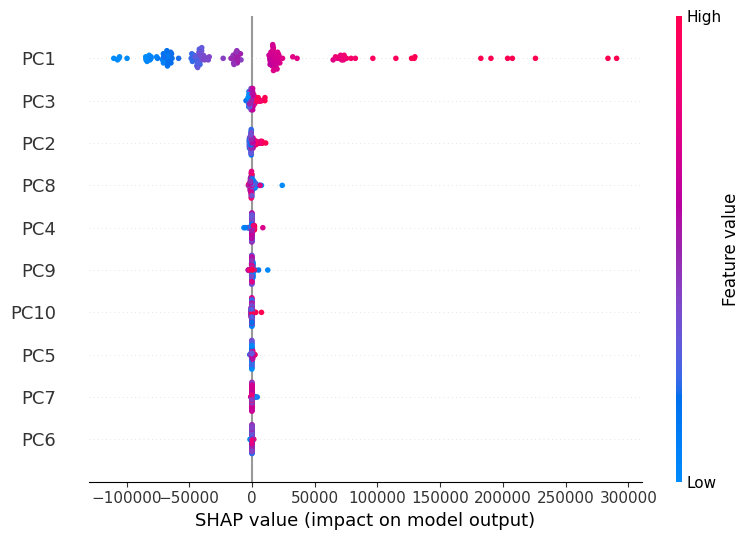

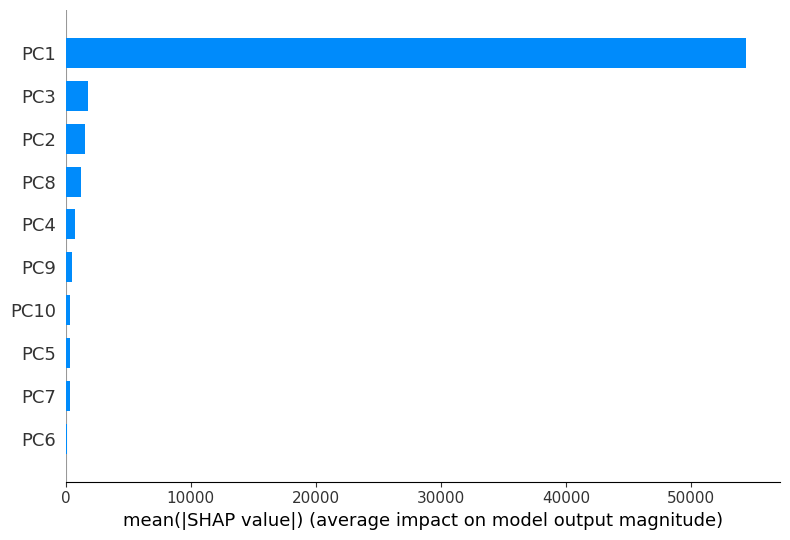

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,33892.9992
max_depth,4
n_estimators,100


wandb: Agent Starting Run: e31du0yr with config:
wandb: 	dataset_name: Standard_PCA
wandb: 	max_depth: 6
wandb: 	n_estimators: 50


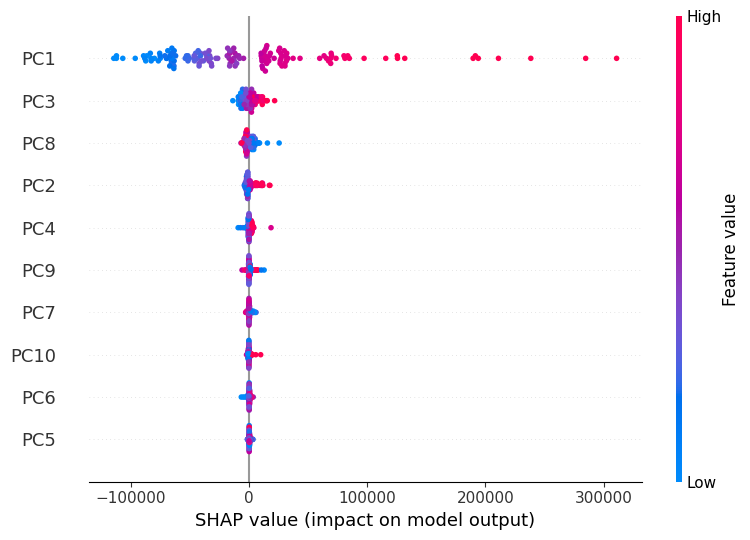

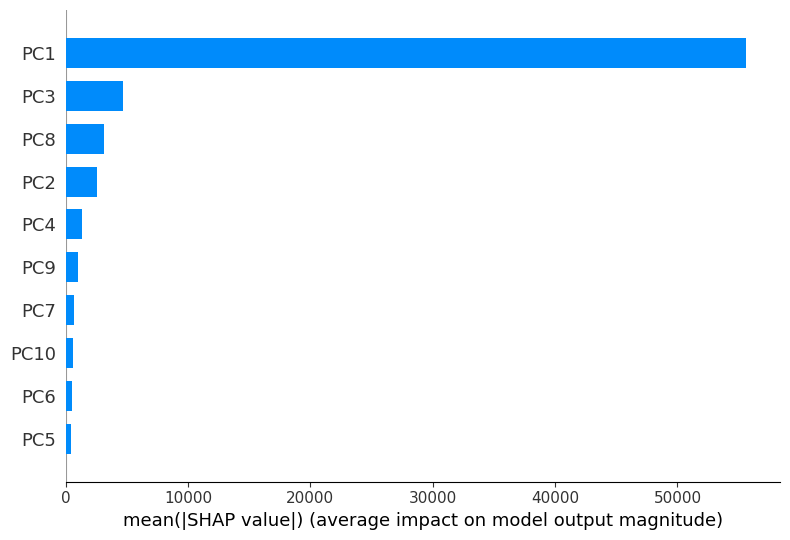

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,30806.44032
max_depth,6
n_estimators,50


wandb: Agent Starting Run: cwtrar7l with config:
wandb: 	dataset_name: Standard_PCA
wandb: 	max_depth: 6
wandb: 	n_estimators: 100


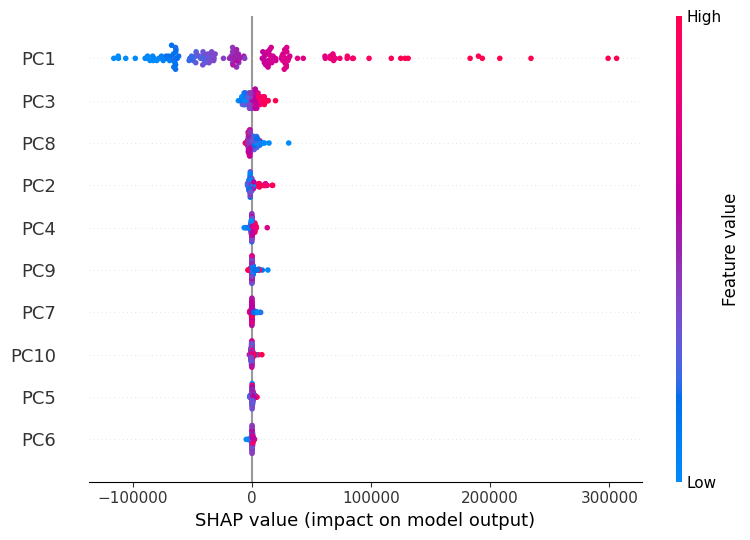

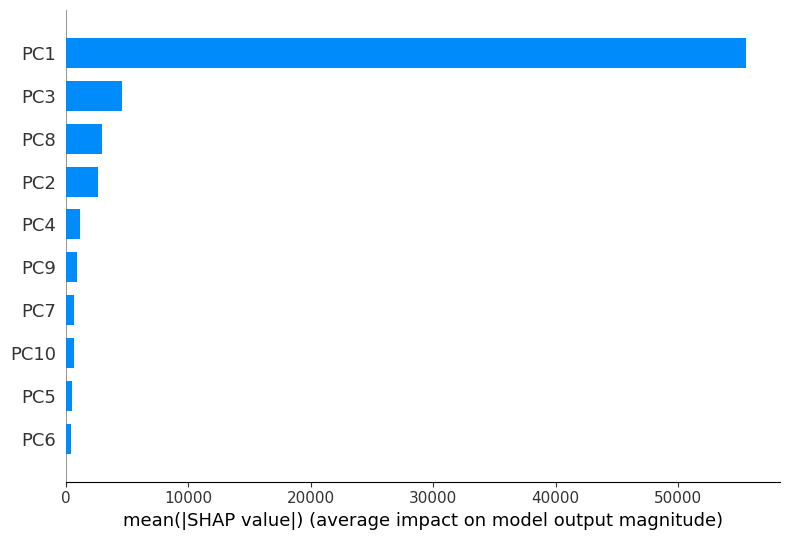

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,30962.61871
max_depth,6
n_estimators,100


wandb: Agent Starting Run: ac6cesi4 with config:
wandb: 	dataset_name: MinMax_RFE
wandb: 	max_depth: 4
wandb: 	n_estimators: 50


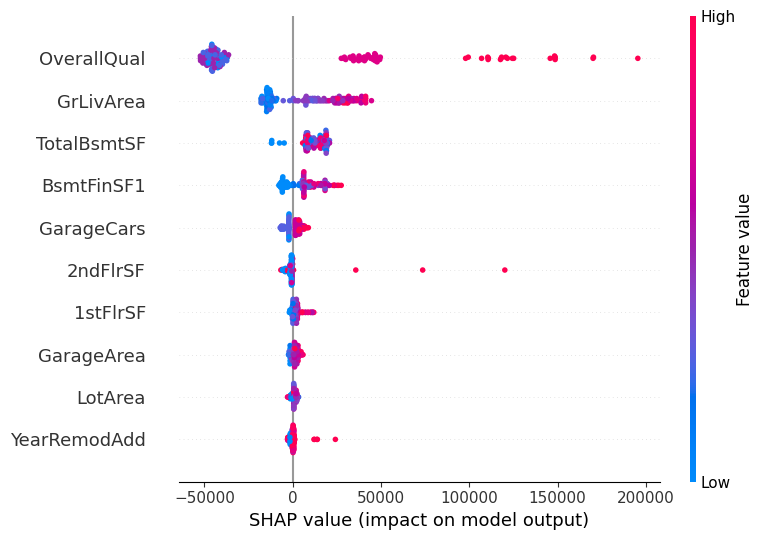

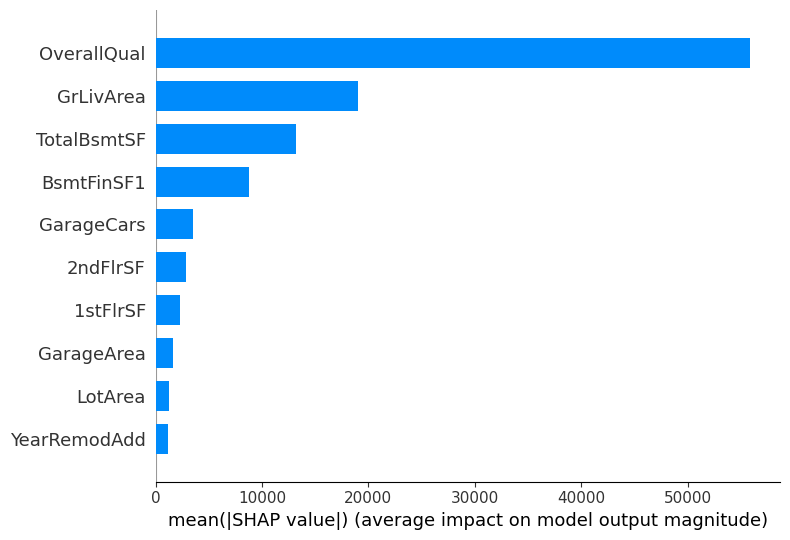

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,33347.65425
max_depth,4
n_estimators,50


wandb: Agent Starting Run: i386hhgd with config:
wandb: 	dataset_name: MinMax_RFE
wandb: 	max_depth: 4
wandb: 	n_estimators: 100


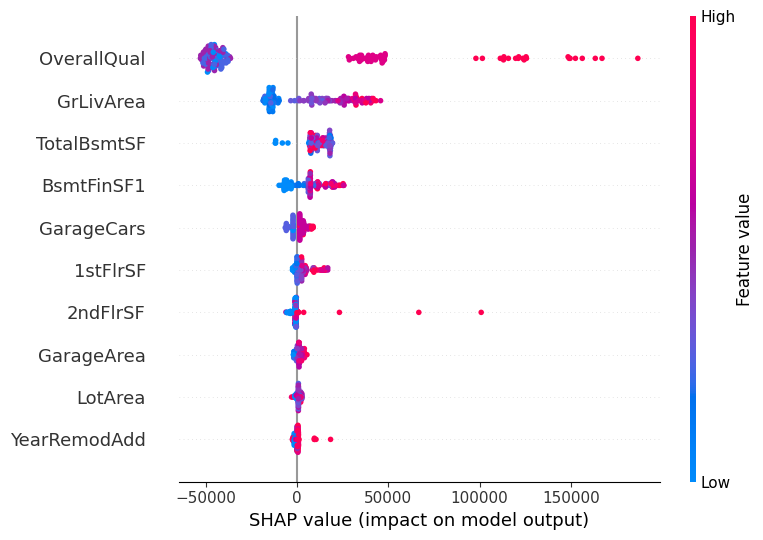

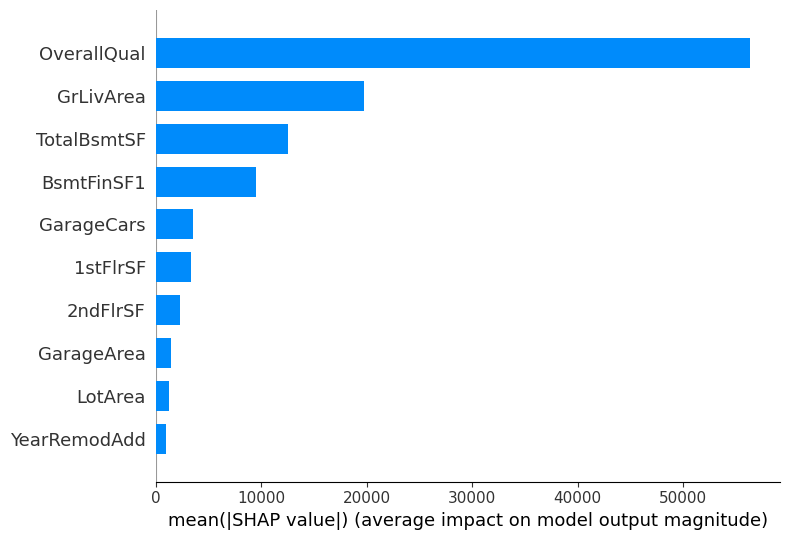

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,32856.91425
max_depth,4
n_estimators,100


wandb: Agent Starting Run: zw85iwem with config:
wandb: 	dataset_name: MinMax_RFE
wandb: 	max_depth: 6
wandb: 	n_estimators: 50


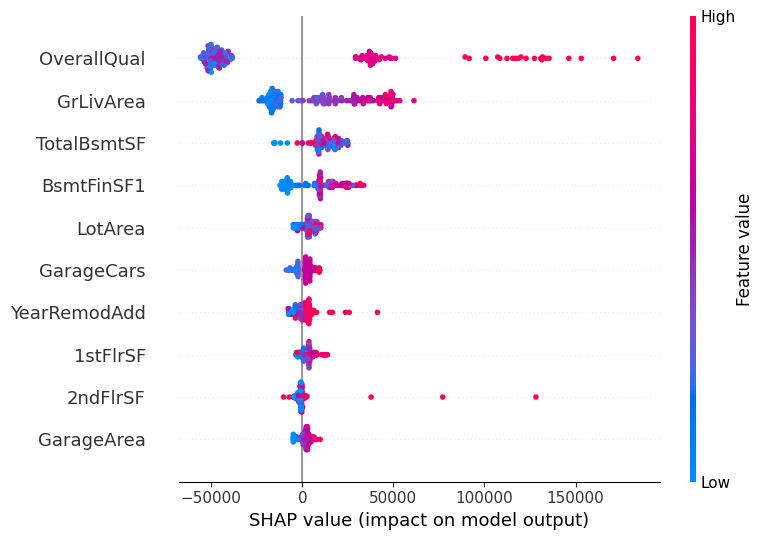

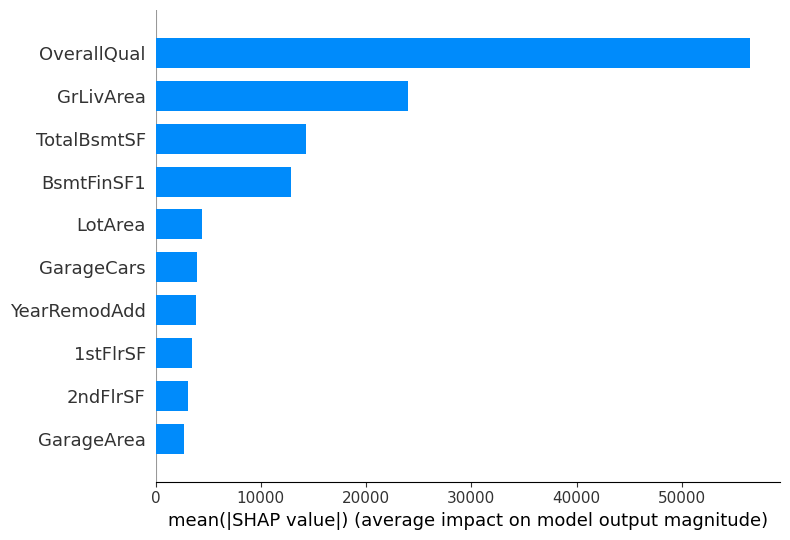

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,28578.66819
max_depth,6
n_estimators,50


wandb: Agent Starting Run: o9gf12u6 with config:
wandb: 	dataset_name: MinMax_RFE
wandb: 	max_depth: 6
wandb: 	n_estimators: 100


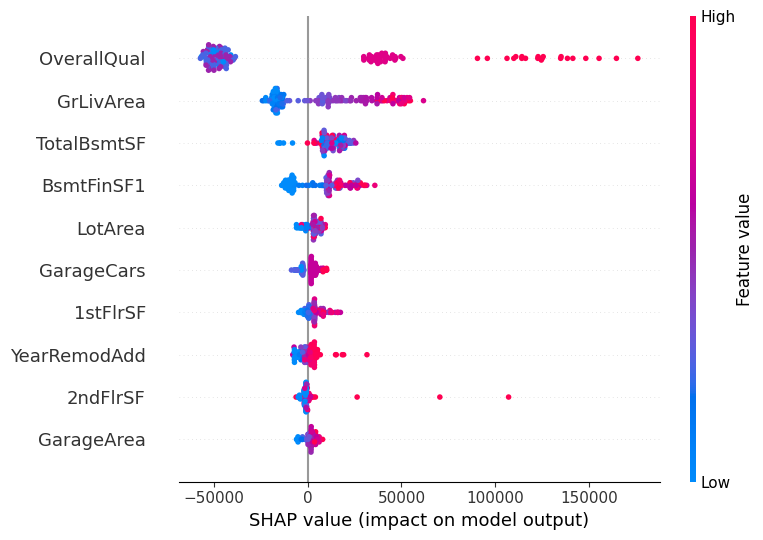

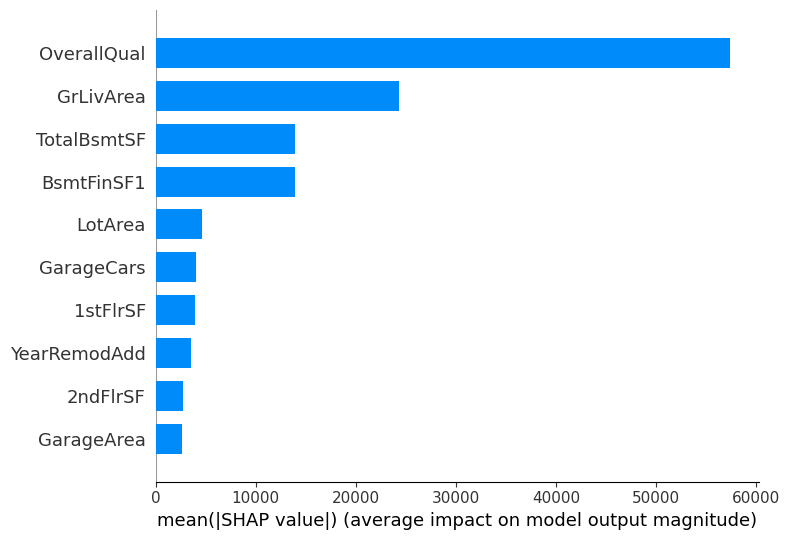

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,28036.06204
max_depth,6
n_estimators,100


wandb: Agent Starting Run: cxlbuwfq with config:
wandb: 	dataset_name: MinMax_PCA
wandb: 	max_depth: 4
wandb: 	n_estimators: 50


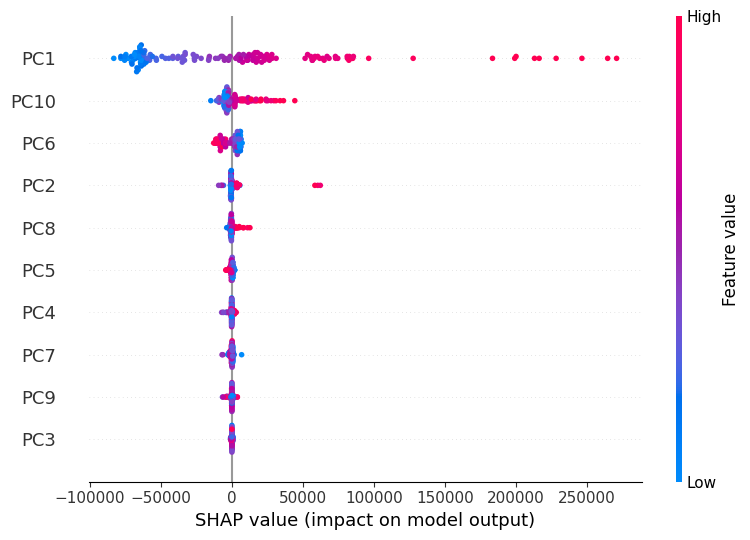

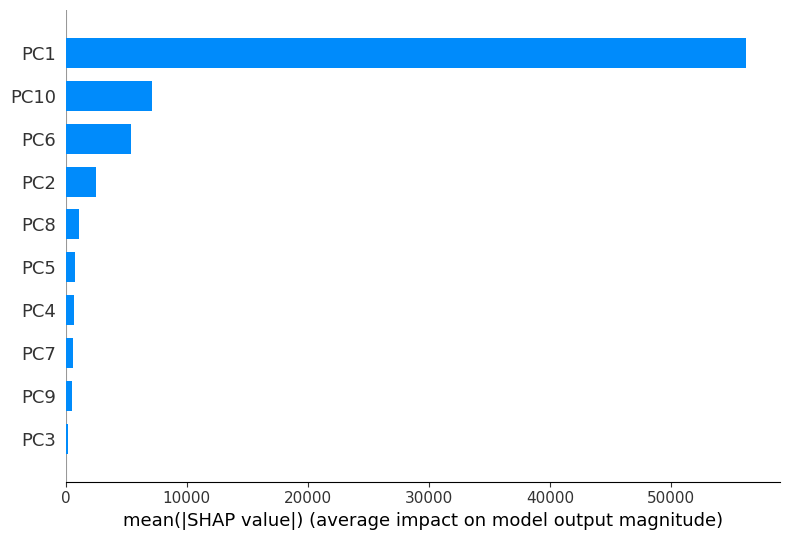

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,40570.08772
max_depth,4
n_estimators,50


wandb: Agent Starting Run: y2z2bjy6 with config:
wandb: 	dataset_name: MinMax_PCA
wandb: 	max_depth: 4
wandb: 	n_estimators: 100


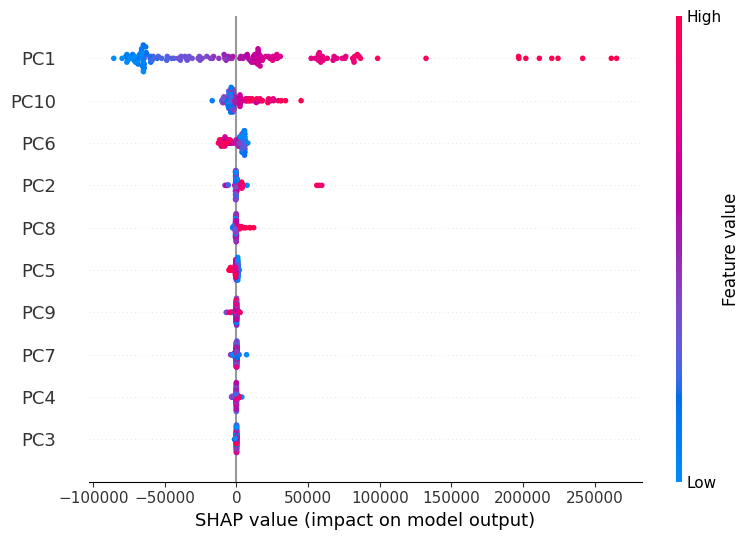

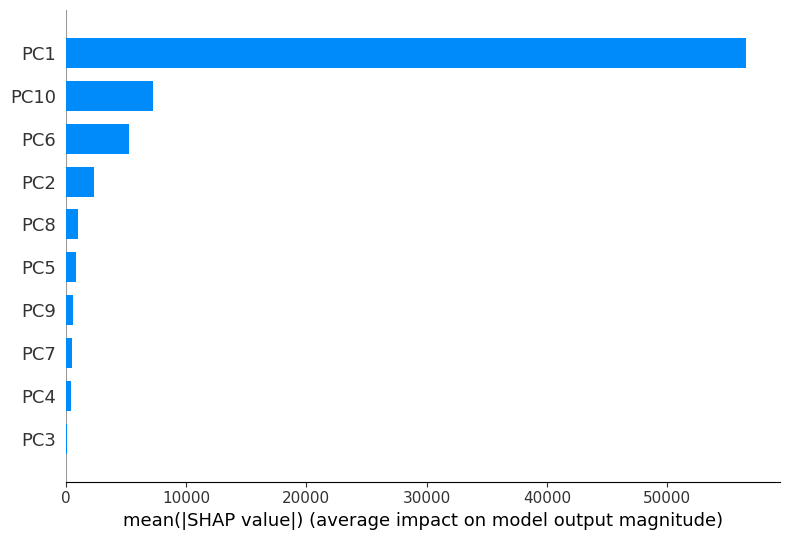

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,40600.45083
max_depth,4
n_estimators,100


wandb: Agent Starting Run: uptil66z with config:
wandb: 	dataset_name: MinMax_PCA
wandb: 	max_depth: 6
wandb: 	n_estimators: 50


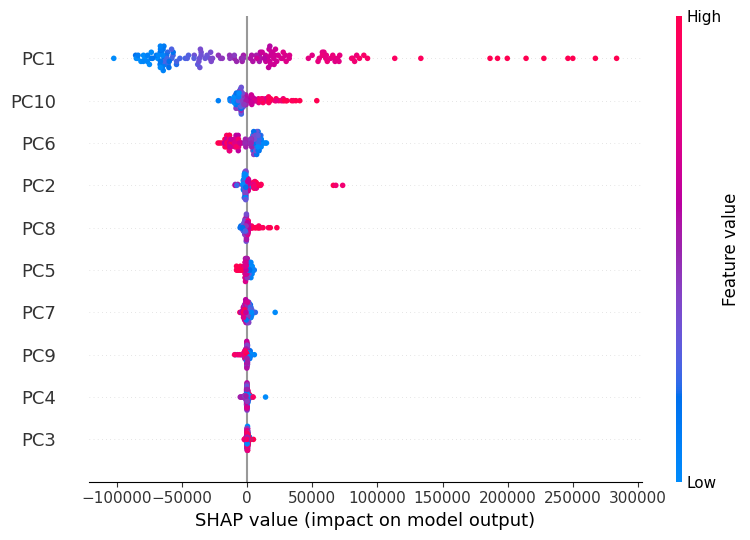

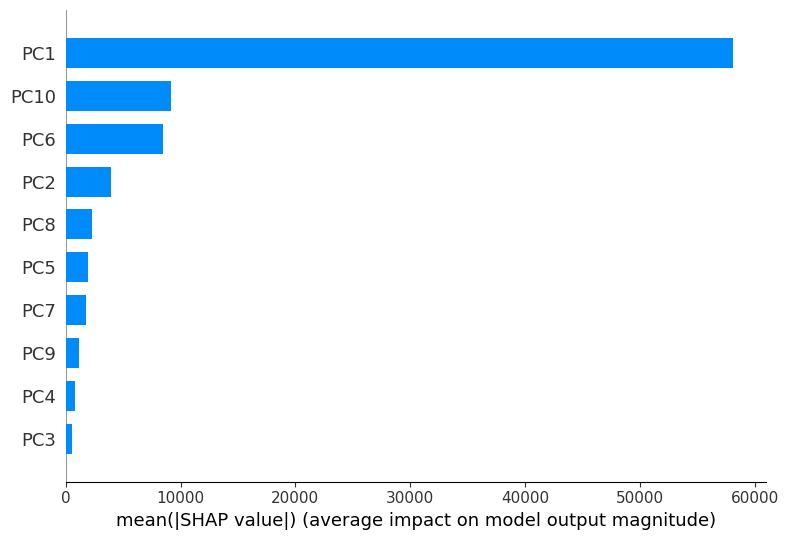

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,38449.19403
max_depth,6
n_estimators,50


wandb: Agent Starting Run: wmxbvua3 with config:
wandb: 	dataset_name: MinMax_PCA
wandb: 	max_depth: 6
wandb: 	n_estimators: 100


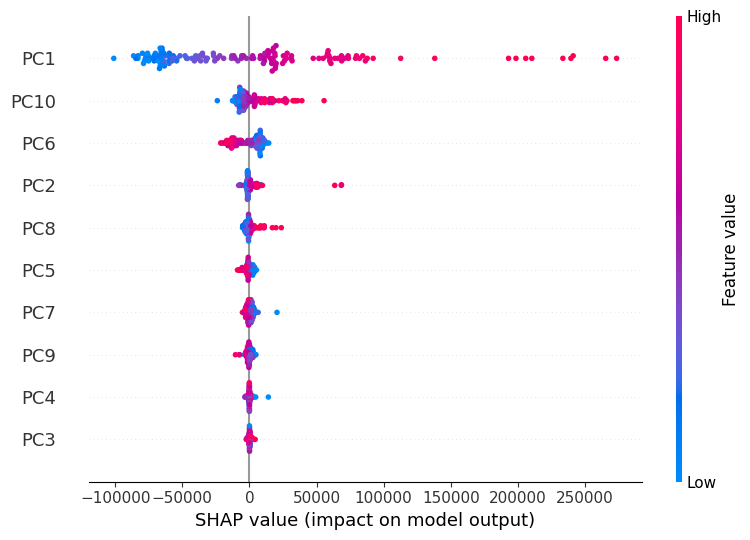

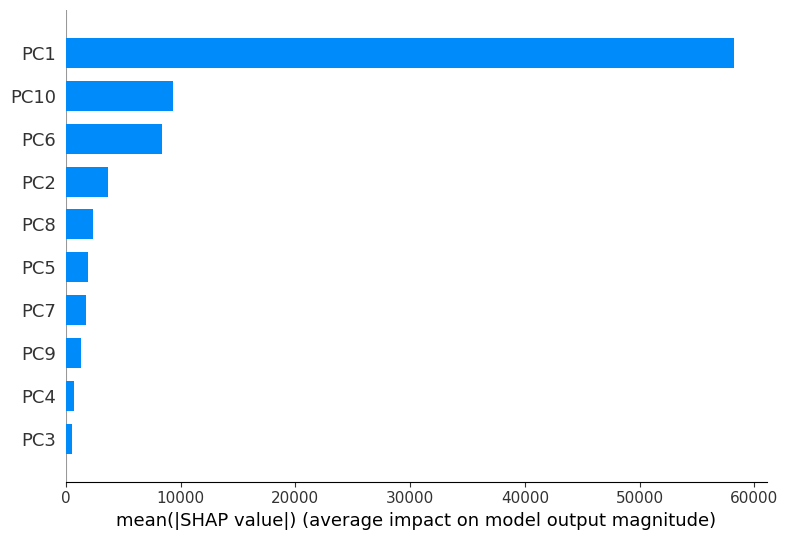

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,37693.48591
max_depth,6
n_estimators,100


wandb: Agent Starting Run: jbe7en1r with config:
wandb: 	dataset_name: Log_RFE
wandb: 	max_depth: 4
wandb: 	n_estimators: 50


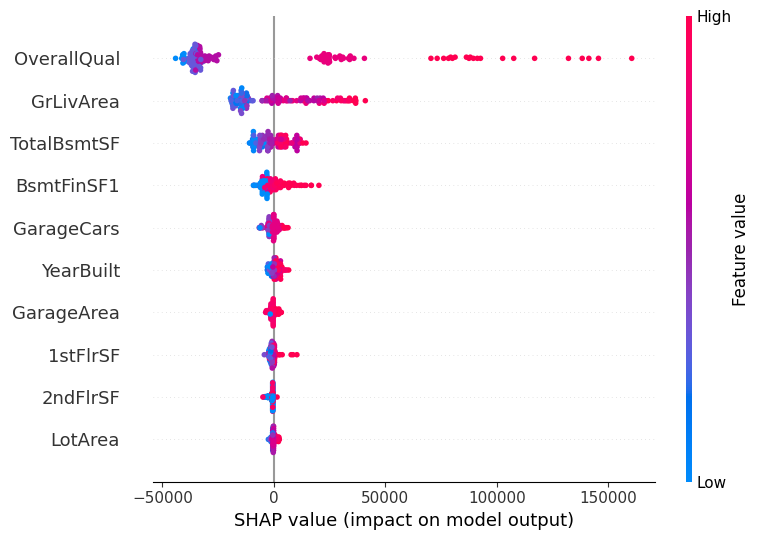

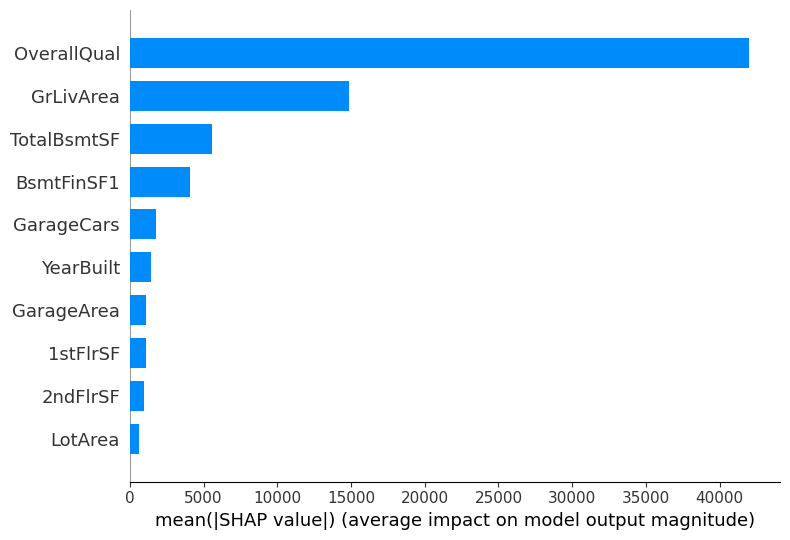

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,32624.61539
max_depth,4
n_estimators,50


wandb: Agent Starting Run: oo9xe2ah with config:
wandb: 	dataset_name: Log_RFE
wandb: 	max_depth: 4
wandb: 	n_estimators: 100


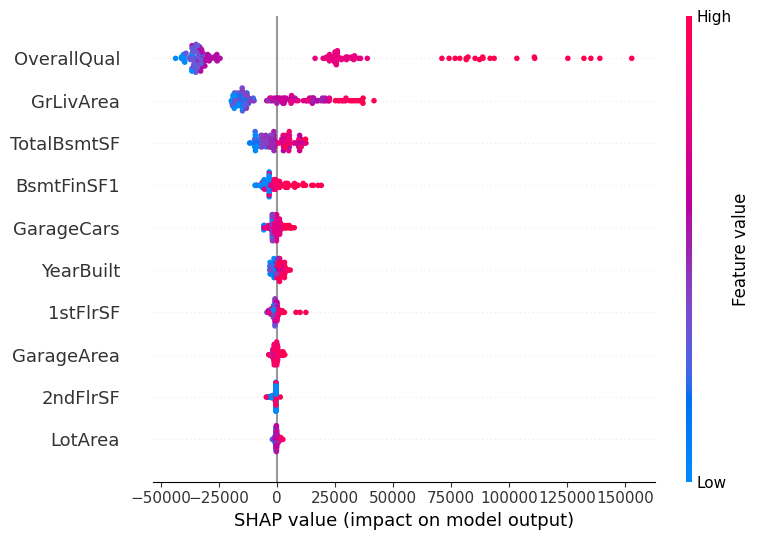

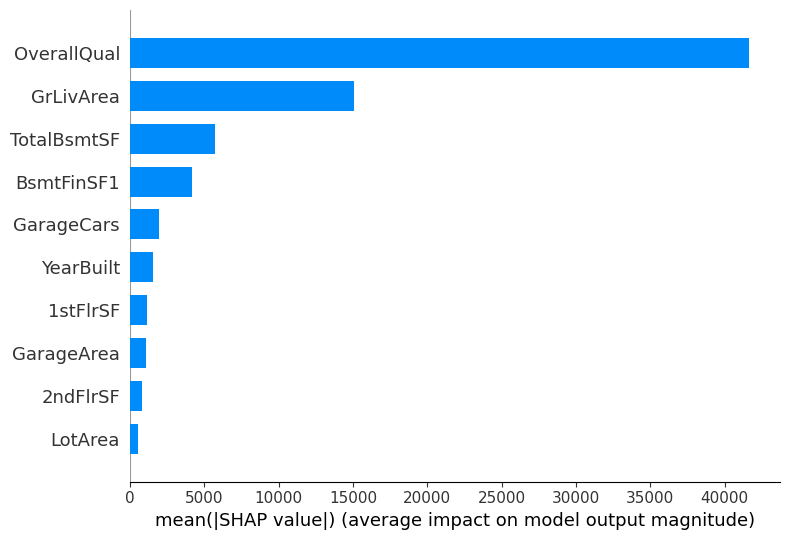

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,32450.02492
max_depth,4
n_estimators,100


wandb: Agent Starting Run: k38ijhq2 with config:
wandb: 	dataset_name: Log_RFE
wandb: 	max_depth: 6
wandb: 	n_estimators: 50


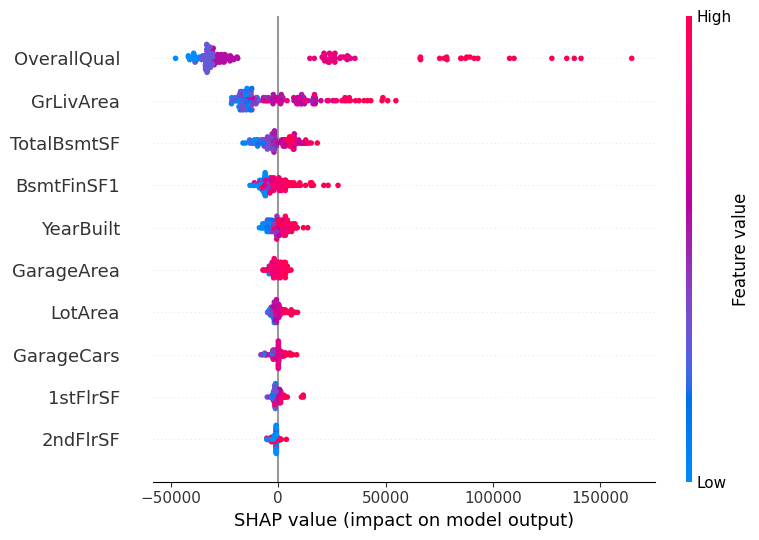

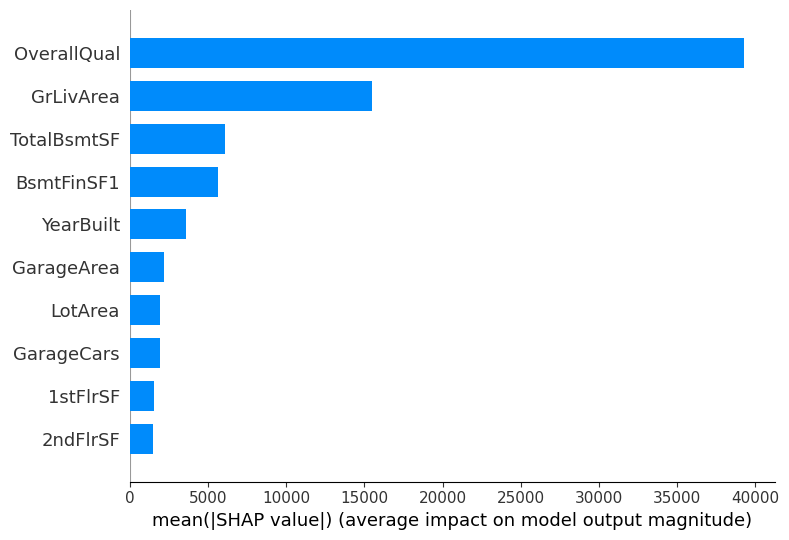

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,28328.19801
max_depth,6
n_estimators,50


wandb: Agent Starting Run: 3ble8uvd with config:
wandb: 	dataset_name: Log_RFE
wandb: 	max_depth: 6
wandb: 	n_estimators: 100


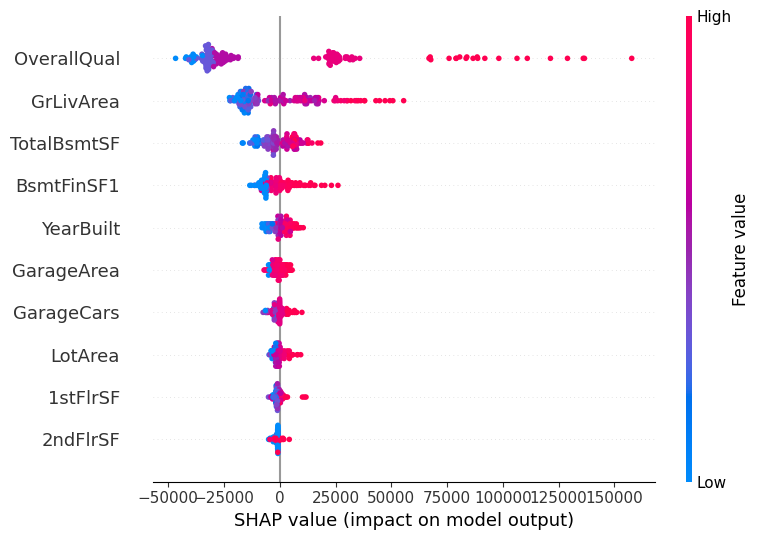

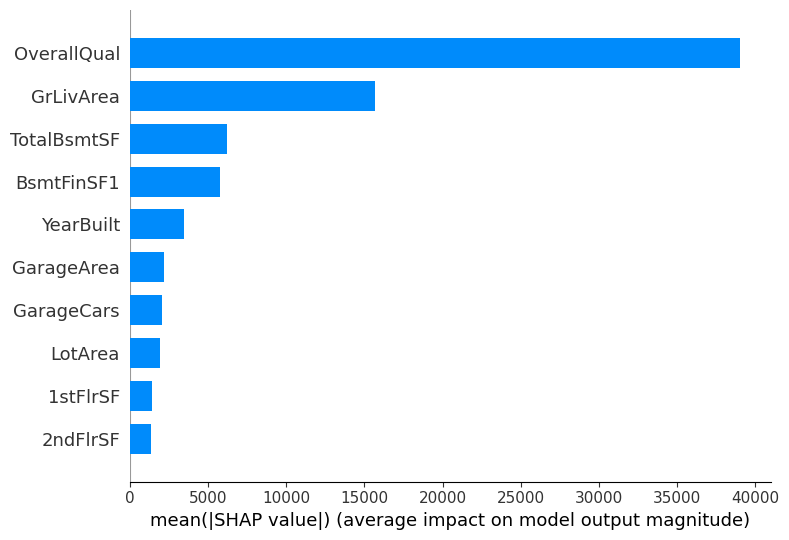

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,28197.84931
max_depth,6
n_estimators,100


wandb: Agent Starting Run: z7c5r74h with config:
wandb: 	dataset_name: Log_PCA
wandb: 	max_depth: 4
wandb: 	n_estimators: 50


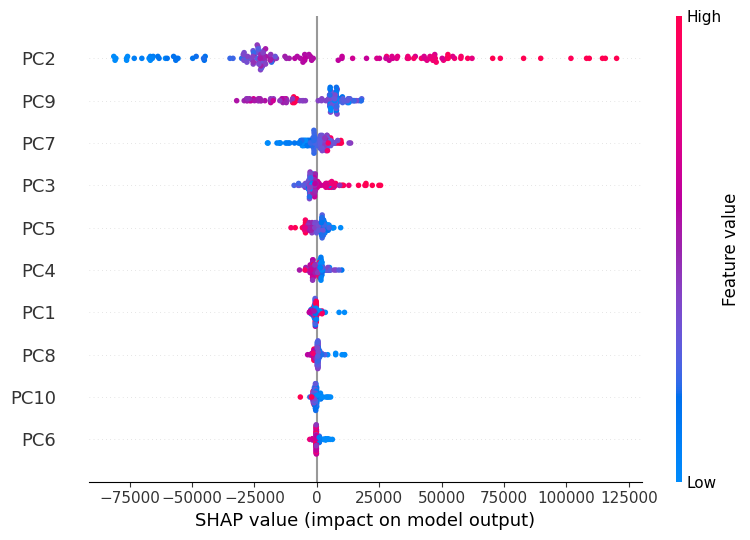

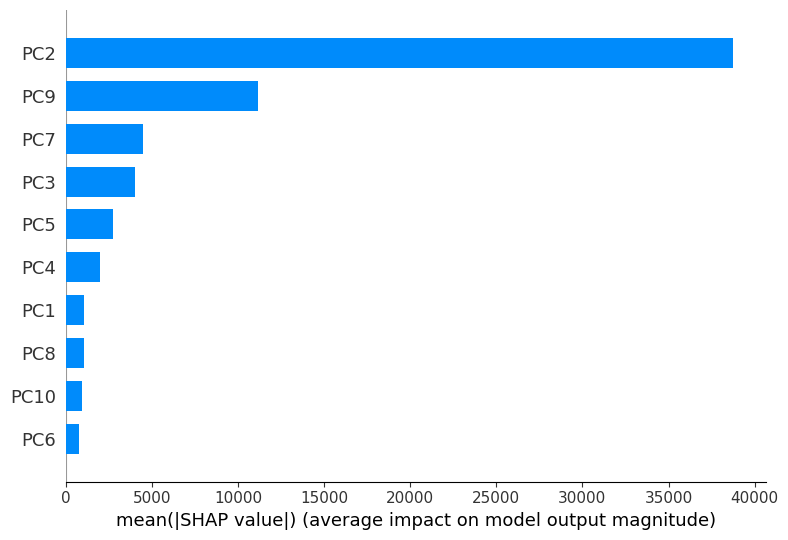

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,50279.44454
max_depth,4
n_estimators,50


wandb: Agent Starting Run: k0jylrlm with config:
wandb: 	dataset_name: Log_PCA
wandb: 	max_depth: 4
wandb: 	n_estimators: 100


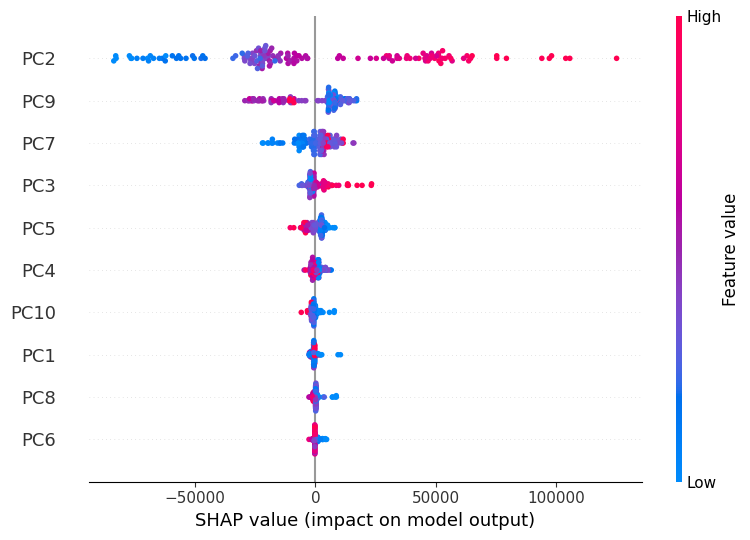

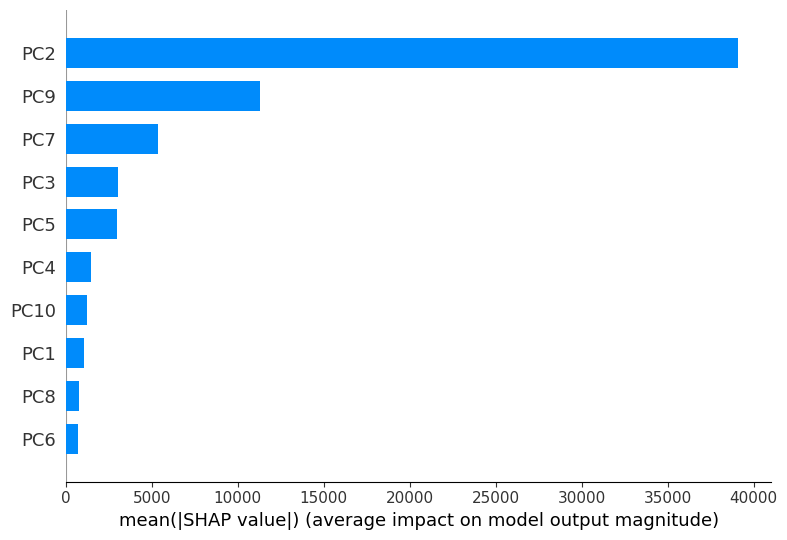

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,50476.11847
max_depth,4
n_estimators,100


wandb: Agent Starting Run: gawucq41 with config:
wandb: 	dataset_name: Log_PCA
wandb: 	max_depth: 6
wandb: 	n_estimators: 50


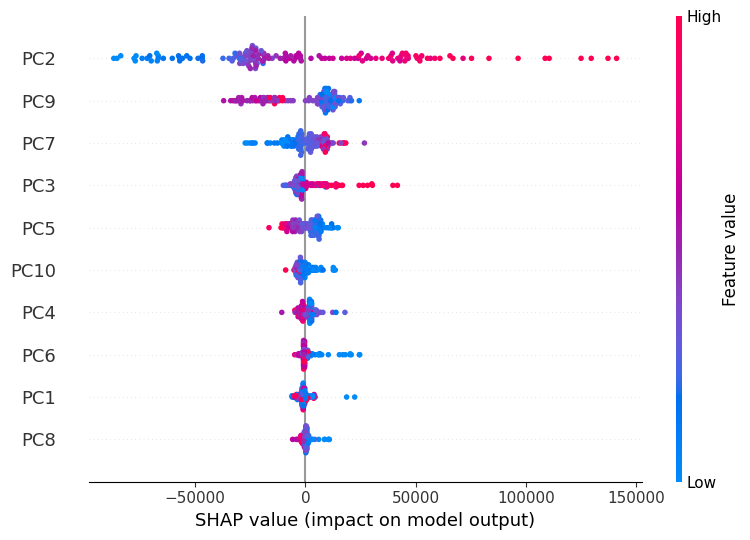

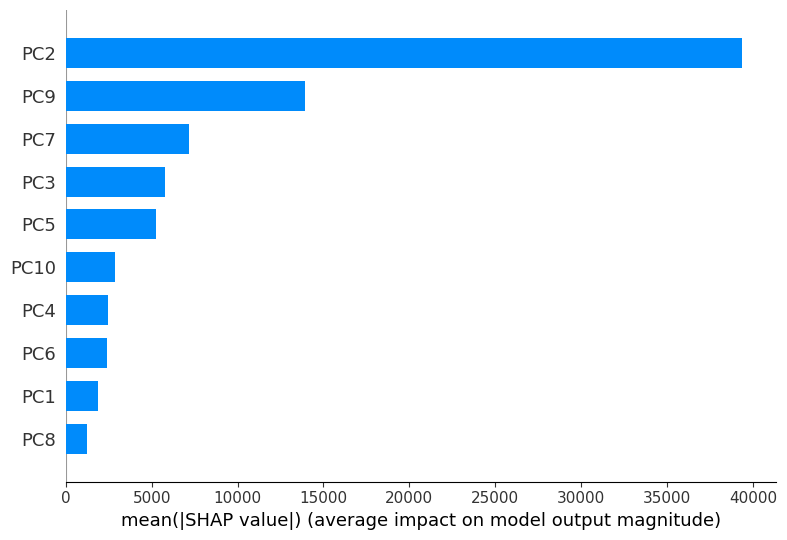

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,48412.44054
max_depth,6
n_estimators,50


wandb: Agent Starting Run: 8cutc2mq with config:
wandb: 	dataset_name: Log_PCA
wandb: 	max_depth: 6
wandb: 	n_estimators: 100


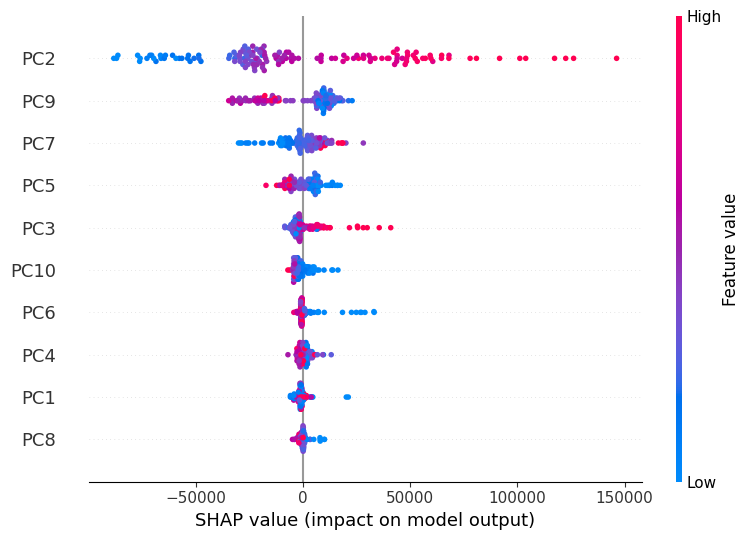

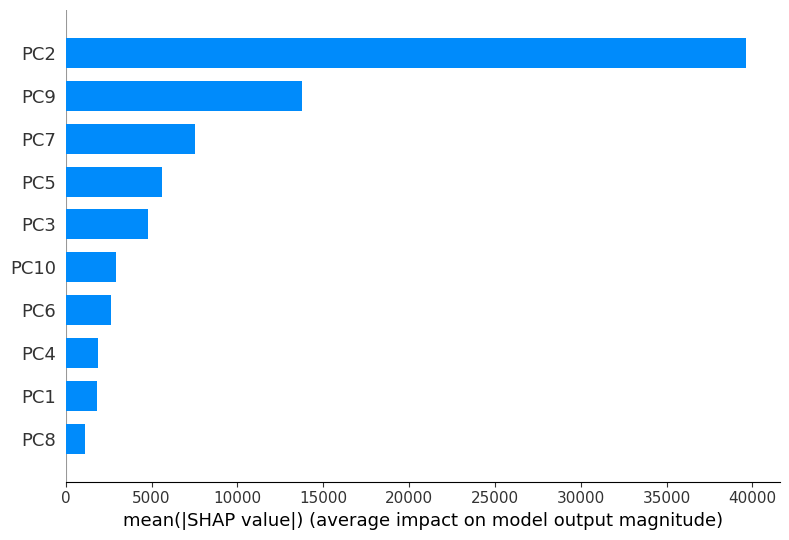

final_validation_loss,▁
max_depth,▁
n_estimators,▁
final_validation_loss,48112.47891
max_depth,6
n_estimators,100


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


╒══════════════╤═════════════╤══════════════════╤═════════╤══════════╤═════════╕
│ Dataset      │   Max Depth │   Num Estimators │    RMSE │       R2 │    MAPE │
╞══════════════╪═════════════╪══════════════════╪═════════╪══════════╪═════════╡
│ Standard_RFE │           4 │               50 │ 31671.4 │ 0.819638 │ 13      │
├──────────────┼─────────────┼──────────────────┼─────────┼──────────┼─────────┤
│ Standard_RFE │           4 │              100 │ 31038.9 │ 0.826771 │ 12.8742 │
├──────────────┼─────────────┼──────────────────┼─────────┼──────────┼─────────┤
│ Standard_RFE │           6 │               50 │ 29797   │ 0.840355 │ 11.6864 │
├──────────────┼─────────────┼──────────────────┼─────────┼──────────┼─────────┤
│ Standard_RFE │           6 │              100 │ 28955   │ 0.84925  │ 11.5711 │
├──────────────┼─────────────┼──────────────────┼─────────┼──────────┼─────────┤
│ Standard_PCA │           4 │               50 │ 29636.6 │ 0.842069 │ 11.941  │
├──────────────┼────────────

In [ ]:
import wandb
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from tabulate import tabulate
import shap
import matplotlib.pyplot as plt

# Define the datasets
datasets = {
    "Standard_RFE": (df_train_standard_rfe, df_test_standard_rfe),
    "Standard_PCA": (df_train_standard_pca, df_test_standard_pca),
    "MinMax_RFE": (df_train_minmax_rfe, df_test_minmax_rfe),
    "MinMax_PCA": (df_train_minmax_pca, df_test_minmax_pca),
    "Log_RFE": (df_train_log_rfe, df_test_log_rfe),
    "Log_PCA": (df_train_log_pca, df_test_log_pca)
}

# Define the sweep configuration
sweep_config = {
    'method': 'grid',
    'parameters': {
        'max_depth': {
            'values': [4, 6]
        },
        'n_estimators': {
            'values': [50, 100]
        },
        'dataset_name': {
            'values': list(datasets.keys())
        }
    }
}

# Initialize W&B project
sweep_id = wandb.sweep(sweep_config, project="IS580-TermProject-RandomForest")

# Initialize results list
results_list = []

# Define a callback class for logging metrics to W&B
class WandbLogger:
    def after_iteration(self, info):
        if hasattr(info, 'iteration') and hasattr(info, 'learn') and hasattr(info, 'validation'):
            wandb.log({
                "epoch": info.iteration,
                "validation_loss": info.validation.rmse
            })
        return True

# Define a function for training and evaluating the model
def train():
    # Initialize a new W&B run
    wandb.init()

    # Get hyperparameters from W&B config
    max_depth = wandb.config.max_depth
    n_estimators = wandb.config.n_estimators
    dataset_name = wandb.config.dataset_name

    train_data, test_data = datasets[dataset_name]

    # Split train_data into train and validation sets
    train_data.reset_index(drop=True, inplace=True)
    test_data.reset_index(drop=True, inplace=True)
    np.random.shuffle(train_data.values)
    train_size = int(0.8 * len(train_data))
    train_set = train_data[:train_size]
    val_set = train_data[train_size:]

    # Extract features and target variable
    X_train, y_train = train_set.drop(columns=["SalePrice"]), train_set["SalePrice"]
    X_val, y_val = val_set.drop(columns=["SalePrice"]), val_set["SalePrice"]
    X_test, y_test = test_data.drop(columns=["SalePrice"]), test_data["SalePrice"]

    # Initialize Random Forest regressor
    model = RandomForestRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=42)

    # Train the model
    model.fit(X_train, y_train)

    # Evaluate on validation set
    val_preds = model.predict(X_val)
    val_loss = np.sqrt(mean_squared_error(y_val, val_preds))

    # Log hyperparameters and final validation loss to W&B
    wandb.log({"max_depth": max_depth, "n_estimators": n_estimators, "final_validation_loss": val_loss})

    # Evaluate on test set
    test_preds = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, test_preds))
    r2 = r2_score(y_test, test_preds)
    mape = np.mean(np.abs((y_test - test_preds) / y_test)) * 100

    # Print SHAP values and plots
    explainer = shap.Explainer(model)
    shap_values = explainer(X_test)
    shap.summary_plot(shap_values, X_test)
    shap.summary_plot(shap_values, X_test, plot_type="bar")

    # Append results to the list
    results_list.append([dataset_name, max_depth, n_estimators, rmse, r2, mape])

    # Finish the W&B run
    wandb.finish()

# Initialize and run the sweep
wandb.agent(sweep_id, function=train)

# Print results in tabular format
headers = ["Dataset", "Max Depth", "Num Estimators", "RMSE", "R2", "MAPE"]
print(tabulate(results_list, headers=headers, tablefmt="fancy_grid"))


## WandB Links

https://wandb.ai/engindenizerkan/IS580-TermProject-Catboost

https://wandb.ai/engindenizerkan/IS580-TermProject-RandomForest